In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

### Library installation

In [ ]:
# Install Ultralytics YOLO
pip install ultralytics

# Import libraries
import os
import cv2
import matplotlib.pyplot as plt
from glob import glob
from ultralytics import YOLO
import random
import numpy as np


## **Visualizing of Imgages**

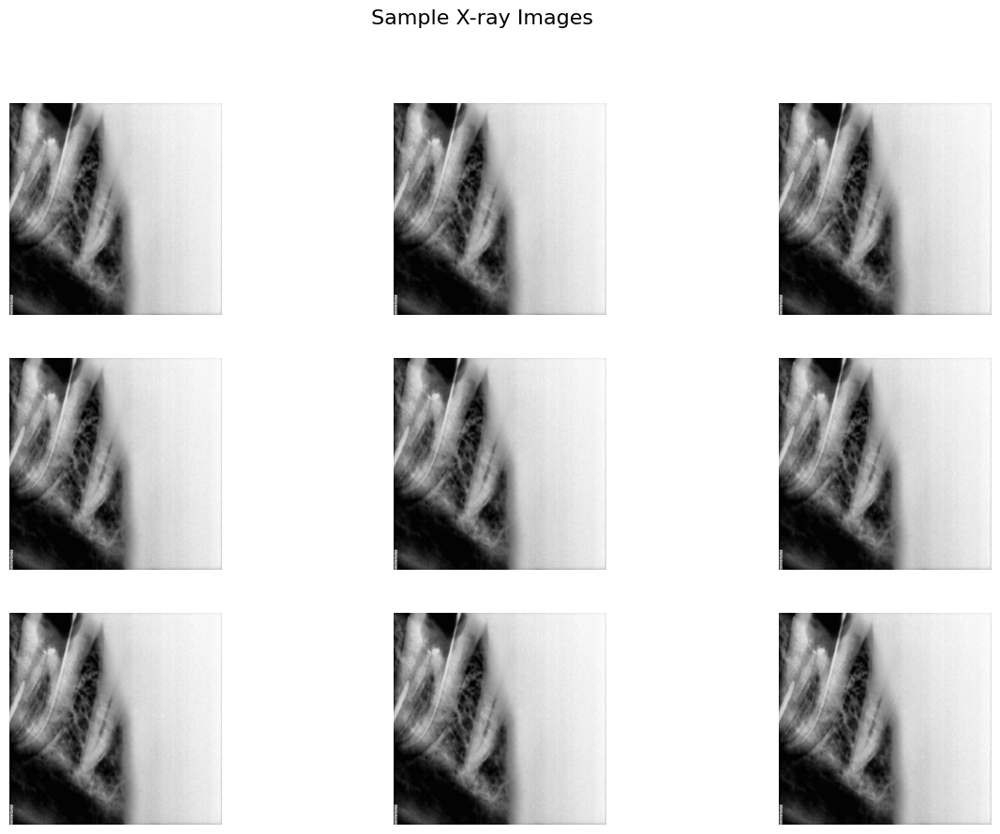

In [2]:
# Load and visualize random X-ray images
image_paths = glob("/kaggle/input/cavity-datasets/images/train/image_5651.jpg")

# Show some images
plt.figure(figsize=(15,10))
for i in range(9):
    img = cv2.imread(random.choice(image_paths))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(3,3,i+1)
    plt.imshow(img)
    plt.axis('off')
plt.suptitle('Sample X-ray Images', fontsize=16)
plt.show()


In [3]:
image_dir = '/kaggle/input/cavity-datasets/images'
label_dir = '/kaggle/input/cavity-datasets/labels'

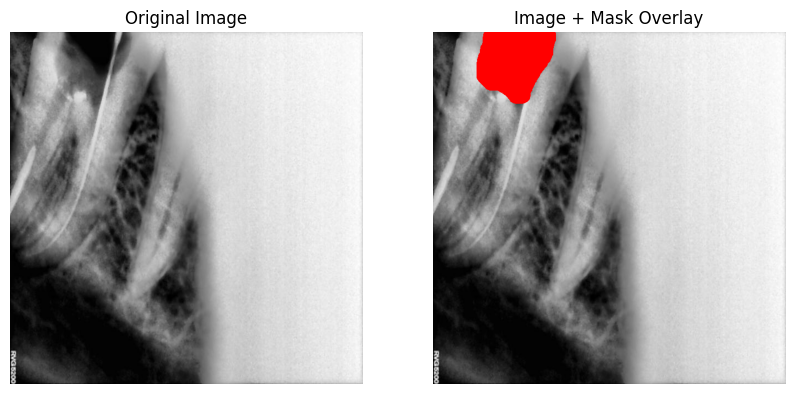

In [9]:
import cv2
import os
import matplotlib.pyplot as plt

# Paths (adjust to your dataset)
image_path = '/kaggle/input/cavity-datasets/images/train/image_5651.jpg'
mask_path = '/kaggle/input/cavity-datasets/masks/train/image_5651.png'

# Load image and mask
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

# Resize mask if needed
if mask.shape != image.shape[:2]:
    mask = cv2.resize(mask, (image.shape[1], image.shape[0]))

# Overlay mask (red)
overlay = image.copy()
overlay[mask > 0] = [255, 0, 0]  # red overlay

# Show
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(image)
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("Image + Mask Overlay")
plt.imshow(overlay)
plt.axis("off")
plt.show()


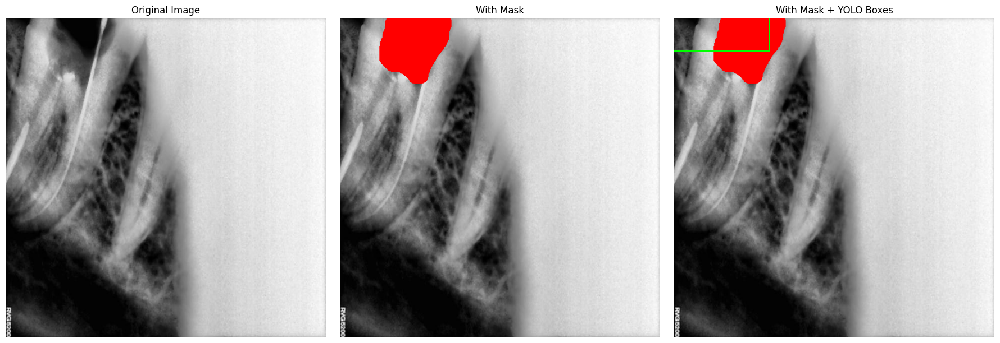

In [13]:
import os
import cv2
import matplotlib.pyplot as plt

# Define paths
base_path = '/kaggle/input/cavity-datasets'
img_dir = os.path.join(base_path, 'images/train')
mask_dir = os.path.join(base_path, 'masks/train')
label_dir = os.path.join(base_path, 'labels/train')

# Choose the base filename (no extension)
base_filename = 'image_5651'

# Correct file paths
img_path = os.path.join(img_dir, base_filename + '.jpg')
mask_path = os.path.join(mask_dir, base_filename + '.png')
label_path = os.path.join(label_dir, base_filename + '.txt')

# Load image and mask
image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

# Resize mask if needed
if mask.shape != image.shape[:2]:
    mask = cv2.resize(mask, (image.shape[1], image.shape[0]))

# Draw mask in red
masked_image = image.copy()
masked_image[mask > 0] = [255, 0, 0]

# Draw bounding boxes from YOLO labels
image_with_boxes = masked_image.copy()
h, w, _ = image.shape
if os.path.exists(label_path):
    with open(label_path, 'r') as f:
        for line in f.readlines():
            cls, xc, yc, bw, bh = map(float, line.strip().split())
            x1 = int((xc - bw / 2) * w)
            y1 = int((yc - bh / 2) * h)
            x2 = int((xc + bw / 2) * w)
            y2 = int((yc + bh / 2) * h)
            cv2.rectangle(image_with_boxes, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(image_with_boxes, str(int(cls)), (x1, y1 - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)
else:
    print(f"Label file not found: {label_path}")

# Show the visualizations
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(image)
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("With Mask")
plt.imshow(masked_image)
plt.axis("off")

plt.subplot(1, 3, 3)
plt.title("With Mask + YOLO Boxes")
plt.imshow(image_with_boxes)
plt.axis("off")

plt.tight_layout()
plt.show()


### **Config training yml file**

In [14]:
# Define the content of the YAML file
data_yaml = """
path: /kaggle/input/cavity-datasets
train: images/train
val: images/val

nc: 1
names: ['cavity']
"""

# Write the YAML content to a file
with open("data.yml", "w") as f:
    f.write(data_yaml)

# Optional: Print confirmation
print("✅ 'data.yml' has been created and saved successfully.")

✅ 'data.yml' has been created and saved successfully.


## **YOLO v8 Nano model training for object detection**

In [17]:
from ultralytics import YOLO

model = YOLO('yolov8n.pt') 

model.train(
    data='/kaggle/working/data.yml',
    epochs=100,
    imgsz=640,
    batch=8,
    device=0,           # GPU if available
    augment=True,       # enables built-in strong augmentations
    patience=20,        # early stopping if no improvement
    cos_lr=True         # cosine learning rate scheduling
)


Ultralytics 8.3.121 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/working/data.yml, epochs=100, time=None, patience=20, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_w

100%|██████████| 755k/755k [00:00<00:00, 44.4MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 162MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 11.7±4.1 MB/s, size: 38.2 KB)


train: Scanning /kaggle/input/cavity-datasets/labels/train... 290 images, 0 backgrounds, 0 corrupt: 100%|██████████| 290/290 [00:00<00:00, 367.48it/s]

WARNING ⚠️ train: Cache directory /kaggle/input/cavity-datasets/labels is not writeable, cache not saved.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 14.1±3.4 MB/s, size: 45.2 KB)


val: Scanning /kaggle/input/cavity-datasets/labels/val... 10 images, 0 backgrounds, 0 corrupt: 100%|██████████| 10/10 [00:00<00:00, 350.70it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/cavity-datasets/labels is not writeable, cache not saved.


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train2
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      1.17G      2.646      3.554      2.906          4        640: 100%|██████████| 37/37 [00:05<00:00,  6.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]

                   all         10         10    0.00267        0.8    0.00944      0.005



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100       1.3G      2.442      3.362      2.655          8        640: 100%|██████████| 37/37 [00:04<00:00,  8.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.40it/s]

                   all         10         10    0.00333          1    0.00614    0.00202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100       1.3G      2.495      3.227       2.72          4        640: 100%|██████████| 37/37 [00:04<00:00,  8.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.31it/s]

                   all         10         10     0.0503        0.2     0.0163    0.00415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100       1.3G      2.413      3.148      2.678          5        640: 100%|██████████| 37/37 [00:04<00:00,  8.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.30it/s]

                   all         10         10    0.00638        0.4    0.00449    0.00106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100       1.3G      2.463      3.113      2.674          5        640: 100%|██████████| 37/37 [00:04<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.53it/s]


                   all         10         10    0.00342        0.3     0.0078    0.00259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100       1.3G      2.332      3.098      2.606          3        640: 100%|██████████| 37/37 [00:04<00:00,  8.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.90it/s]

                   all         10         10    0.00133        0.4     0.0027   0.000777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100       1.3G      2.259      2.967      2.541          5        640: 100%|██████████| 37/37 [00:04<00:00,  8.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.45it/s]

                   all         10         10    0.00436        0.2    0.00373    0.00156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100       1.3G      2.302      2.978      2.614          3        640: 100%|██████████| 37/37 [00:04<00:00,  8.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.69it/s]

                   all         10         10     0.0158        0.3     0.0272    0.00637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100       1.3G      2.248      2.965      2.546          3        640: 100%|██████████| 37/37 [00:04<00:00,  8.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.60it/s]

                   all         10         10    0.00516        0.6     0.0304    0.00974



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100       1.3G       2.23      3.029      2.566          4        640: 100%|██████████| 37/37 [00:04<00:00,  8.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.62it/s]

                   all         10         10     0.0179        0.6       0.11     0.0246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100       1.3G      2.184      2.947      2.545          4        640: 100%|██████████| 37/37 [00:04<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.89it/s]

                   all         10         10    0.00545        0.6    0.00762    0.00307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100       1.3G      2.216      2.912      2.523          5        640: 100%|██████████| 37/37 [00:04<00:00,  8.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.84it/s]

                   all         10         10    0.00275        0.5    0.00327    0.00159



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100       1.3G      2.178      2.938      2.496          4        640: 100%|██████████| 37/37 [00:04<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.80it/s]

                   all         10         10    0.00183        0.5    0.00206   0.000849



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100       1.3G       2.21      2.918      2.505          4        640: 100%|██████████| 37/37 [00:04<00:00,  8.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.39it/s]

                   all         10         10    0.00208        0.6    0.00297    0.00112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100       1.3G      2.171      2.791      2.492          4        640: 100%|██████████| 37/37 [00:04<00:00,  8.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.11it/s]

                   all         10         10    0.00279        0.8     0.0152    0.00417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100       1.3G      2.151      2.858      2.443          2        640: 100%|██████████| 37/37 [00:04<00:00,  8.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.60it/s]

                   all         10         10    0.00283        0.8    0.00972    0.00271



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100       1.3G      2.161      2.719      2.419          2        640: 100%|██████████| 37/37 [00:04<00:00,  8.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.62it/s]

                   all         10         10      0.027        0.5     0.0262     0.0101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100       1.3G       2.16      2.759      2.438          6        640: 100%|██████████| 37/37 [00:04<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 15.52it/s]

                   all         10         10    0.00375          1     0.0529     0.0256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100       1.3G      2.193      2.796      2.433          4        640: 100%|██████████| 37/37 [00:04<00:00,  8.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.34it/s]

                   all         10         10     0.0333        0.4     0.0964     0.0394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100       1.3G      2.122      2.837      2.448          2        640: 100%|██████████| 37/37 [00:04<00:00,  8.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.18it/s]

                   all         10         10    0.00268        0.6    0.00946    0.00593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100       1.3G      2.131      2.771      2.468          2        640: 100%|██████████| 37/37 [00:04<00:00,  8.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.71it/s]

                   all         10         10    0.00428          1     0.0225     0.0107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100       1.3G       2.15      2.693      2.417          6        640: 100%|██████████| 37/37 [00:04<00:00,  8.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.00it/s]

                   all         10         10     0.0111        0.6     0.0208    0.00736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100       1.3G      2.129      2.705      2.394          4        640: 100%|██████████| 37/37 [00:04<00:00,  8.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.09it/s]

                   all         10         10     0.0199        0.6     0.0335     0.0143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100       1.3G      2.146      2.745      2.424          7        640: 100%|██████████| 37/37 [00:04<00:00,  8.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 15.00it/s]

                   all         10         10    0.00381          1     0.0236    0.00863



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100       1.3G      2.136      2.704      2.385          7        640: 100%|██████████| 37/37 [00:04<00:00,  8.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.14it/s]

                   all         10         10    0.00314        0.5    0.00923    0.00368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100       1.3G      2.055      2.705      2.334          4        640: 100%|██████████| 37/37 [00:04<00:00,  8.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.94it/s]

                   all         10         10    0.00544          1     0.0433     0.0197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100       1.3G      2.093      2.689      2.368          2        640: 100%|██████████| 37/37 [00:04<00:00,  8.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.87it/s]

                   all         10         10     0.0304        0.5     0.0201    0.00871



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100       1.3G      2.127      2.692      2.374          2        640: 100%|██████████| 37/37 [00:04<00:00,  8.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.73it/s]

                   all         10         10      0.012        0.4       0.17     0.0976



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100       1.3G      2.089      2.713      2.364          4        640: 100%|██████████| 37/37 [00:04<00:00,  8.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.62it/s]

                   all         10         10    0.00548          1     0.0544     0.0191



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100       1.3G      2.067       2.64      2.348          5        640: 100%|██████████| 37/37 [00:04<00:00,  8.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.71it/s]

                   all         10         10    0.00681          1     0.0957     0.0504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100       1.3G      2.063      2.647      2.317          3        640: 100%|██████████| 37/37 [00:04<00:00,  8.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.46it/s]

                   all         10         10     0.0686        0.5     0.0734     0.0349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100       1.3G      2.064      2.684      2.352          6        640: 100%|██████████| 37/37 [00:04<00:00,  8.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.31it/s]

                   all         10         10     0.0641        0.5     0.0819     0.0336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100       1.3G      2.027      2.619      2.333          7        640: 100%|██████████| 37/37 [00:04<00:00,  8.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.27it/s]

                   all         10         10     0.0642        0.5      0.326       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100       1.3G      2.019      2.635      2.294          8        640: 100%|██████████| 37/37 [00:04<00:00,  8.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.02it/s]

                   all         10         10     0.0909        0.4     0.0815     0.0369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100       1.3G      1.953      2.621      2.273          3        640: 100%|██████████| 37/37 [00:04<00:00,  8.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.85it/s]

                   all         10         10     0.0504        0.5     0.0966     0.0395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100       1.3G      2.024      2.676      2.309          4        640: 100%|██████████| 37/37 [00:04<00:00,  8.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.76it/s]

                   all         10         10     0.0458        0.5     0.0725     0.0316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100       1.3G      2.021      2.639      2.328          5        640: 100%|██████████| 37/37 [00:04<00:00,  8.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.45it/s]

                   all         10         10     0.0703        0.5      0.109     0.0414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100       1.3G      1.998      2.734      2.267          2        640: 100%|██████████| 37/37 [00:04<00:00,  8.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.59it/s]

                   all         10         10    0.00476        0.7     0.0326     0.0107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100       1.3G      2.005      2.697       2.32          3        640: 100%|██████████| 37/37 [00:04<00:00,  8.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.49it/s]

                   all         10         10    0.00404        0.6     0.0491     0.0128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100       1.3G       2.02      2.627      2.313          4        640: 100%|██████████| 37/37 [00:04<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.29it/s]

                   all         10         10     0.0175      0.564     0.0504     0.0167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100       1.3G      2.012      2.615      2.303          5        640: 100%|██████████| 37/37 [00:04<00:00,  8.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.73it/s]

                   all         10         10     0.0111          1     0.0743     0.0289



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100       1.3G      2.007      2.614      2.303          7        640: 100%|██████████| 37/37 [00:04<00:00,  8.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.37it/s]

                   all         10         10     0.0134        0.8     0.0627     0.0283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100       1.3G      1.997      2.582      2.286          2        640: 100%|██████████| 37/37 [00:04<00:00,  8.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.84it/s]

                   all         10         10      0.347        0.4      0.242     0.0811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100       1.3G      1.971      2.575      2.261          5        640: 100%|██████████| 37/37 [00:04<00:00,  8.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.01it/s]

                   all         10         10     0.0619        0.5      0.239     0.0849



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100       1.3G      2.048      2.584      2.328          3        640: 100%|██████████| 37/37 [00:04<00:00,  8.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.59it/s]

                   all         10         10      0.129        0.5     0.0976     0.0395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100       1.3G      1.945      2.593      2.252          4        640: 100%|██████████| 37/37 [00:04<00:00,  8.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 15.55it/s]

                   all         10         10      0.033        0.5     0.0754     0.0285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100       1.3G      1.953      2.565       2.24          2        640: 100%|██████████| 37/37 [00:04<00:00,  8.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 15.13it/s]

                   all         10         10     0.0645        0.5      0.112     0.0525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100       1.3G      1.976      2.532      2.252          6        640: 100%|██████████| 37/37 [00:04<00:00,  8.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.66it/s]

                   all         10         10      0.121      0.457      0.112     0.0419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100       1.3G      1.958      2.547      2.223          2        640: 100%|██████████| 37/37 [00:04<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.27it/s]

                   all         10         10      0.071        0.4      0.124     0.0566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100       1.3G      1.925      2.529      2.225          2        640: 100%|██████████| 37/37 [00:04<00:00,  8.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.63it/s]

                   all         10         10      0.126        0.4      0.155     0.0587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100       1.3G      1.916      2.509      2.173          5        640: 100%|██████████| 37/37 [00:04<00:00,  8.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.24it/s]

                   all         10         10     0.0287        0.5      0.114     0.0391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100       1.3G      1.939      2.529      2.204          3        640: 100%|██████████| 37/37 [00:04<00:00,  8.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 16.10it/s]

                   all         10         10     0.0848        0.1     0.0808      0.023



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100       1.3G      1.886      2.472      2.201          5        640: 100%|██████████| 37/37 [00:04<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.72it/s]

                   all         10         10      0.219        0.3      0.196      0.064


EarlyStopping: Training stopped early as no improvement observed in last 20 epochs. Best results observed at epoch 33, best model saved as best.pt.
To update EarlyStopping(patience=20) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

53 epochs completed in 0.068 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.2MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.121 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.59it/s]


                   all         10         10      0.103        0.5      0.179     0.0632


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 11.5ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/train2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a2c67da8a10>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

### validation of the model

In [18]:
results = model.val()
print(results.box) 


Ultralytics 8.3.121 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.1 ms, read: 93.3±13.3 MB/s, size: 43.0 KB)


val: Scanning /kaggle/input/cavity-datasets/labels/val... 10 images, 0 backgrounds, 0 corrupt: 100%|██████████| 10/10 [00:00<00:00, 574.74it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/cavity-datasets/labels is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.70it/s]


                   all         10         10      0.103        0.5      0.179      0.063


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 4.6ms preprocess, 37.6ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detect/train22
ultralytics.utils.metrics.Metric object with attributes:

all_ap: array([[    0.17907,     0.12649,     0.12041,    0.084789,    0.056811,    0.042528,    0.019793,           0,           0,           0]])
ap: array([    0.06299])
ap50: array([    0.17907])
ap_class_index: array([0])
curves: []
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.0

In [ ]:
model.predict(source='/kaggle/input/cavity-datasets/images/val', save=True)

In [28]:
model.predict(
    source='/kaggle/input/cavity-datasets/images/val',
    save=True,
    conf=0.01  # Lower confidence threshold to see weak detections
)



image 1/10 /kaggle/input/cavity-datasets/images/val/image_5608.jpg: 640x640 48 cavitys, 8.2ms
image 2/10 /kaggle/input/cavity-datasets/images/val/image_5613.jpg: 640x640 48 cavitys, 5.9ms
image 3/10 /kaggle/input/cavity-datasets/images/val/image_5617.jpg: 640x640 31 cavitys, 5.8ms
image 4/10 /kaggle/input/cavity-datasets/images/val/image_5620.jpg: 640x640 23 cavitys, 6.0ms
image 5/10 /kaggle/input/cavity-datasets/images/val/image_5622.jpg: 640x640 13 cavitys, 5.6ms
image 6/10 /kaggle/input/cavity-datasets/images/val/image_5629.jpg: 640x640 13 cavitys, 5.6ms
image 7/10 /kaggle/input/cavity-datasets/images/val/image_5630.jpg: 640x640 26 cavitys, 5.7ms
image 8/10 /kaggle/input/cavity-datasets/images/val/image_5635.jpg: 640x640 17 cavitys, 5.5ms
image 9/10 /kaggle/input/cavity-datasets/images/val/image_5637.jpg: 640x640 17 cavitys, 5.7ms
image 10/10 /kaggle/input/cavity-datasets/images/val/image_5648.jpg: 640x640 33 cavitys, 5.6ms
Speed: 1.4ms preprocess, 6.0ms inference, 1.3ms postproces

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'cavity'}
 obb: None
 orig_img: array([[[ 77,  77,  77],
         [ 80,  80,  80],
         [ 81,  81,  81],
         ...,
         [185, 185, 185],
         [186, 186, 186],
         [184, 184, 184]],
 
        [[101, 101, 101],
         [107, 107, 107],
         [111, 111, 111],
         ...,
         [209, 209, 209],
         [207, 207, 207],
         [203, 203, 203]],
 
        [[116, 116, 116],
         [125, 125, 125],
         [132, 132, 132],
         ...,
         [227, 227, 227],
         [221, 221, 221],
         [214, 214, 214]],
 
        ...,
 
        [[ 74,  74,  74],
         [ 54,  54,  54],
         [166, 166, 166],
         ...,
         [236, 236, 236],
         [233, 233, 233],
         [230, 230, 230]],
 
        [[ 92,  92,  92],
         [ 50,  50,  50],
         [ 88,  88,  88],
         ...,
         [227, 227

### inference of the model

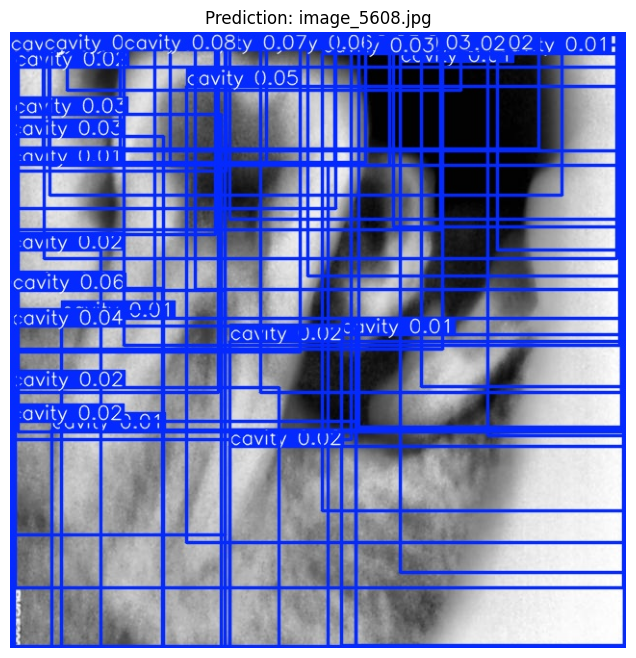

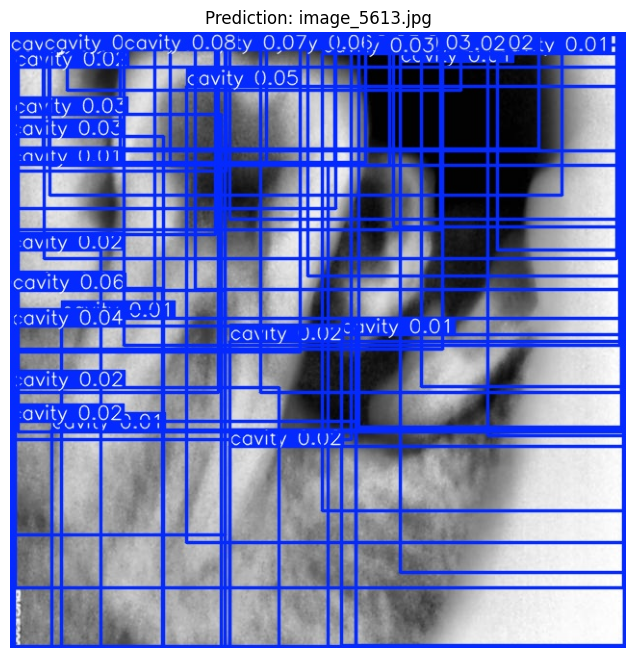

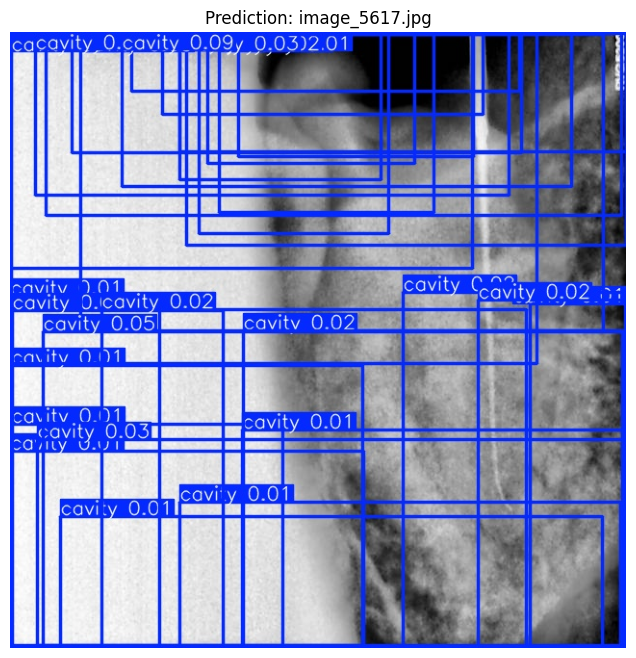

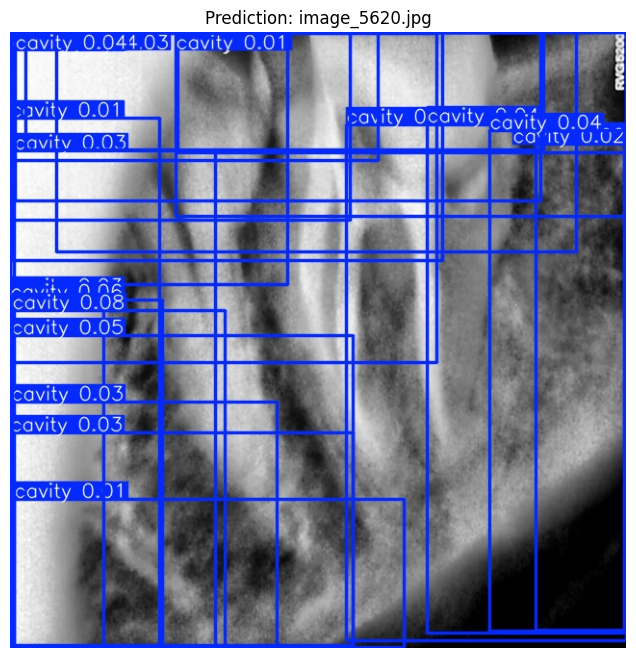

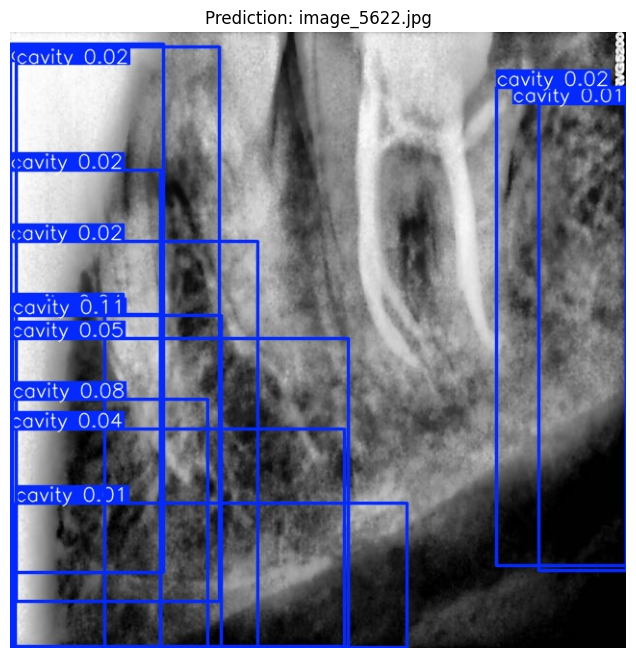

In [29]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Set prediction folder path
predict_dir = '/kaggle/working/runs/detect/predict/'

# List prediction images (usually PNG or JPG)
predicted_images = sorted([
    f for f in os.listdir(predict_dir)
    if f.lower().endswith(('.jpg', '.jpeg', '.png'))
])

# Visualize the first few predicted images
for i in range(min(5, len(predicted_images))):
    img_path = os.path.join(predict_dir, predicted_images[i])
    img = Image.open(img_path)

    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.title(f"Prediction: {predicted_images[i]}")
    plt.axis('off')
    plt.show()


## **Now Training of YOLO v8 small model**

In [47]:
from ultralytics import YOLO

model = YOLO('yolov8s.pt') 

model.train(
    data='/kaggle/working/data.yml',
    epochs=100,
    imgsz=640,
    batch=8,
    device=0,           # GPU if available
    augment=True,       # enables built-in strong augmentations
    patience=20,        # early stopping if no improvement
    cos_lr=True         # cosine learning rate scheduling
)


Ultralytics 8.3.121 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/kaggle/working/data.yml, epochs=100, time=None, patience=20, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_w

train: Scanning /kaggle/input/cavity-datasets/labels/train... 290 images, 0 backgrounds, 0 corrupt: 100%|██████████| 290/290 [00:00<00:00, 683.97it/s]


WARNING ⚠️ train: Cache directory /kaggle/input/cavity-datasets/labels is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 69.6±29.1 MB/s, size: 45.2 KB)


val: Scanning /kaggle/input/cavity-datasets/labels/val... 10 images, 0 backgrounds, 0 corrupt: 100%|██████████| 10/10 [00:00<00:00, 552.27it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/cavity-datasets/labels is not writeable, cache not saved.


Plotting labels to runs/detect/train4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train4
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100       2.3G      2.735      5.085      2.992          4        640: 100%|██████████| 37/37 [00:06<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.06it/s]

                   all         10         10      0.003        0.9     0.0124    0.00393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.56G      2.586      2.951      2.688          8        640: 100%|██████████| 37/37 [00:06<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.59it/s]

                   all         10         10    0.00539        0.2    0.00668    0.00208



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.56G      2.569      2.923      2.715          4        640: 100%|██████████| 37/37 [00:06<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.68it/s]

                   all         10         10    0.00133        0.4     0.0017   0.000318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.56G      2.511      2.939      2.687          5        640: 100%|██████████| 37/37 [00:06<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.85it/s]

                   all         10         10          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.56G      2.533      2.977      2.751          5        640: 100%|██████████| 37/37 [00:06<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.22it/s]

                   all         10         10    0.00238        0.3     0.0272     0.0181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.56G      2.507      3.045       2.69          3        640: 100%|██████████| 37/37 [00:06<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.40it/s]

                   all         10         10          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.56G       2.39      2.963      2.665          5        640: 100%|██████████| 37/37 [00:06<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.40it/s]


                   all         10         10    0.00324        0.8    0.00596    0.00185

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.56G      2.461      3.025      2.733          3        640: 100%|██████████| 37/37 [00:06<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.56it/s]

                   all         10         10          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.56G      2.394      2.982      2.673          3        640: 100%|██████████| 37/37 [00:06<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.36it/s]

                   all         10         10    0.00644        0.7     0.0106    0.00436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.56G      2.328      3.019      2.663          4        640: 100%|██████████| 37/37 [00:06<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.75it/s]

                   all         10         10    0.00333          1     0.0253    0.00881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.56G      2.327      2.983      2.672          4        640: 100%|██████████| 37/37 [00:06<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.75it/s]

                   all         10         10    0.00226        0.6     0.0553     0.0186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.56G      2.317      2.919      2.591          5        640: 100%|██████████| 37/37 [00:06<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.05it/s]

                   all         10         10    0.00304        0.6    0.00969    0.00174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      2.56G      2.353      2.955      2.599          4        640: 100%|██████████| 37/37 [00:06<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.38it/s]

                   all         10         10    0.00348          1     0.0166    0.00536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.56G      2.308      2.984      2.571          4        640: 100%|██████████| 37/37 [00:06<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.12it/s]

                   all         10         10    0.00271        0.7     0.0107    0.00381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.56G      2.294      2.841      2.579          4        640: 100%|██████████| 37/37 [00:06<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.35it/s]

                   all         10         10    0.00335          1    0.00713    0.00207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.56G      2.256      2.877      2.508          2        640: 100%|██████████| 37/37 [00:06<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.35it/s]

                   all         10         10    0.00261        0.7    0.00617    0.00352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.56G      2.244      2.799      2.481          2        640: 100%|██████████| 37/37 [00:06<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.24it/s]

                   all         10         10    0.00471          1     0.0164     0.0081



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      2.56G      2.267      2.811      2.509          6        640: 100%|██████████| 37/37 [00:06<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.20it/s]

                   all         10         10     0.0185        0.5     0.0352     0.0131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.56G       2.24      2.831      2.515          4        640: 100%|██████████| 37/37 [00:06<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.70it/s]

                   all         10         10    0.00731        0.6     0.0327     0.0147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.56G      2.207       2.86      2.506          2        640: 100%|██████████| 37/37 [00:06<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.90it/s]

                   all         10         10     0.0041          1      0.013    0.00532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      2.56G      2.197      2.869      2.491          2        640: 100%|██████████| 37/37 [00:06<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.37it/s]

                   all         10         10     0.0135        0.5      0.051     0.0261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.56G      2.182      2.831      2.494          6        640: 100%|██████████| 37/37 [00:06<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.49it/s]

                   all         10         10      0.036        0.5     0.0267     0.0115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.56G      2.159      2.804      2.479          4        640: 100%|██████████| 37/37 [00:06<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.34it/s]

                   all         10         10    0.00377          1     0.0179    0.00715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.56G      2.179      2.859      2.501          7        640: 100%|██████████| 37/37 [00:06<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.80it/s]

                   all         10         10    0.00281        0.8     0.0139    0.00716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.56G      2.194      2.814      2.462          7        640: 100%|██████████| 37/37 [00:06<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.52it/s]

                   all         10         10     0.0307        0.6     0.0864     0.0329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.56G      2.134        2.8      2.416          4        640: 100%|██████████| 37/37 [00:06<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.47it/s]

                   all         10         10    0.00274        0.6     0.0271    0.00836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.56G      2.151      2.805      2.429          2        640: 100%|██████████| 37/37 [00:06<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.21it/s]

                   all         10         10    0.00355          1     0.0115    0.00421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.56G      2.179      2.804      2.406          2        640: 100%|██████████| 37/37 [00:06<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.35it/s]

                   all         10         10    0.00613        0.6     0.0363     0.0119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      2.56G      2.183      2.808      2.452          4        640: 100%|██████████| 37/37 [00:06<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.71it/s]

                   all         10         10    0.00361          1     0.0395     0.0151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.56G      2.167      2.765      2.439          5        640: 100%|██████████| 37/37 [00:06<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.30it/s]

                   all         10         10    0.00411          1      0.219     0.0761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      2.56G      2.137      2.738      2.433          3        640: 100%|██████████| 37/37 [00:06<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.84it/s]

                   all         10         10    0.00396          1     0.0491     0.0202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.56G      2.133      2.747      2.434          6        640: 100%|██████████| 37/37 [00:06<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.88it/s]

                   all         10         10    0.00391          1     0.0595     0.0333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.56G      2.108      2.746      2.427          7        640: 100%|██████████| 37/37 [00:06<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.58it/s]

                   all         10         10     0.0315        0.6      0.222      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.56G      2.116      2.738      2.398          8        640: 100%|██████████| 37/37 [00:06<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.76it/s]

                   all         10         10     0.0268        0.6     0.0603     0.0322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.56G      2.076      2.681      2.388          3        640: 100%|██████████| 37/37 [00:06<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.37it/s]


                   all         10         10     0.0469        0.5     0.0849     0.0382

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.56G      2.079      2.695      2.378          4        640: 100%|██████████| 37/37 [00:06<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.18it/s]

                   all         10         10      0.168        0.4       0.29     0.0766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.56G      2.085      2.742      2.402          5        640: 100%|██████████| 37/37 [00:06<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.39it/s]


                   all         10         10    0.00726          1     0.0859     0.0232

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.56G      2.095      2.748      2.343          2        640: 100%|██████████| 37/37 [00:06<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.19it/s]

                   all         10         10     0.0457        0.4     0.0608     0.0294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.56G      2.127      2.759      2.406          3        640: 100%|██████████| 37/37 [00:06<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.42it/s]


                   all         10         10     0.0286        0.5     0.0756      0.025

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.56G      2.087      2.741      2.407          4        640: 100%|██████████| 37/37 [00:06<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.37it/s]

                   all         10         10    0.00447          1     0.0739     0.0315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.56G      2.136      2.724      2.392          5        640: 100%|██████████| 37/37 [00:06<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.27it/s]

                   all         10         10    0.00434        0.8      0.118      0.054



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      2.56G      2.058      2.683      2.348          7        640: 100%|██████████| 37/37 [00:06<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.80it/s]

                   all         10         10    0.00259        0.6     0.0194     0.0111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.56G      2.016      2.694      2.334          2        640: 100%|██████████| 37/37 [00:06<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.06it/s]

                   all         10         10     0.0348        0.6     0.0833     0.0415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.56G      2.046      2.667       2.36          5        640: 100%|██████████| 37/37 [00:06<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.86it/s]

                   all         10         10    0.00536          1      0.119     0.0545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.56G      2.055      2.683       2.39          3        640: 100%|██████████| 37/37 [00:06<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.14it/s]

                   all         10         10     0.0881        0.4      0.149     0.0443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.56G      2.031      2.656      2.374          4        640: 100%|██████████| 37/37 [00:06<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.10it/s]

                   all         10         10     0.0823        0.3     0.0921     0.0422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      2.56G      2.063      2.628      2.367          2        640: 100%|██████████| 37/37 [00:06<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.76it/s]

                   all         10         10      0.053        0.1     0.0674     0.0334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.56G      2.044      2.632      2.357          6        640: 100%|██████████| 37/37 [00:06<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.85it/s]

                   all         10         10     0.0972        0.1     0.0985      0.043



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      2.56G      2.036      2.598      2.324          2        640: 100%|██████████| 37/37 [00:06<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.85it/s]

                   all         10         10     0.0624      0.128     0.0745     0.0383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      2.56G      2.001      2.571      2.311          2        640: 100%|██████████| 37/37 [00:06<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.90it/s]

                   all         10         10     0.0331        0.4      0.039     0.0177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.56G      1.977       2.56      2.292          5        640: 100%|██████████| 37/37 [00:06<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.86it/s]

                   all         10         10      0.198        0.1     0.0788     0.0331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.56G      2.014      2.581       2.33          3        640: 100%|██████████| 37/37 [00:06<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.58it/s]

                   all         10         10      0.262        0.1      0.083      0.035



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.56G      1.971      2.567      2.315          5        640: 100%|██████████| 37/37 [00:06<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.52it/s]

                   all         10         10      0.127        0.1     0.0878     0.0366
EarlyStopping: Training stopped early as no improvement observed in last 20 epochs. Best results observed at epoch 33, best model saved as best.pt.
To update EarlyStopping(patience=20) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



53 epochs completed in 0.102 hours.
Optimizer stripped from runs/detect/train4/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train4/weights/best.pt, 22.5MB

Validating runs/detect/train4/weights/best.pt...
Ultralytics 8.3.121 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


                   all         10         10    0.00816        0.8     0.0723      0.034


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 13.9ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detect/train4


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a2c810553d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [49]:
model.predict(source='/kaggle/input/cavity-datasets/images/val', save=True, conf=0.5)



image 1/10 /kaggle/input/cavity-datasets/images/val/image_5608.jpg: 640x640 (no detections), 26.1ms
image 2/10 /kaggle/input/cavity-datasets/images/val/image_5613.jpg: 640x640 (no detections), 24.0ms
image 3/10 /kaggle/input/cavity-datasets/images/val/image_5617.jpg: 640x640 (no detections), 23.9ms
image 4/10 /kaggle/input/cavity-datasets/images/val/image_5620.jpg: 640x640 (no detections), 23.8ms
image 5/10 /kaggle/input/cavity-datasets/images/val/image_5622.jpg: 640x640 (no detections), 22.5ms
image 6/10 /kaggle/input/cavity-datasets/images/val/image_5629.jpg: 640x640 (no detections), 24.2ms
image 7/10 /kaggle/input/cavity-datasets/images/val/image_5630.jpg: 640x640 (no detections), 22.5ms
image 8/10 /kaggle/input/cavity-datasets/images/val/image_5635.jpg: 640x640 (no detections), 22.4ms
image 9/10 /kaggle/input/cavity-datasets/images/val/image_5637.jpg: 640x640 (no detections), 22.4ms
image 10/10 /kaggle/input/cavity-datasets/images/val/image_5648.jpg: 640x640 (no detections), 22.4m

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'cavity'}
 obb: None
 orig_img: array([[[ 77,  77,  77],
         [ 80,  80,  80],
         [ 81,  81,  81],
         ...,
         [185, 185, 185],
         [186, 186, 186],
         [184, 184, 184]],
 
        [[101, 101, 101],
         [107, 107, 107],
         [111, 111, 111],
         ...,
         [209, 209, 209],
         [207, 207, 207],
         [203, 203, 203]],
 
        [[116, 116, 116],
         [125, 125, 125],
         [132, 132, 132],
         ...,
         [227, 227, 227],
         [221, 221, 221],
         [214, 214, 214]],
 
        ...,
 
        [[ 74,  74,  74],
         [ 54,  54,  54],
         [166, 166, 166],
         ...,
         [236, 236, 236],
         [233, 233, 233],
         [230, 230, 230]],
 
        [[ 92,  92,  92],
         [ 50,  50,  50],
         [ 88,  88,  88],
         ...,
         [227, 227

In [55]:
from ultralytics import YOLO

# Load the trained model (use best.pt from your last training)
model1 = YOLO('/kaggle/working/runs/detect/train4/weights/best.pt')

# Run prediction on the validation set
model.predict(
    source='/kaggle/input/cavity-datasets/images/val', 
    save=True,
    conf=0.5  # Low confidence threshold to see more boxes
)



image 1/10 /kaggle/input/cavity-datasets/images/val/image_5608.jpg: 640x640 (no detections), 25.6ms
image 2/10 /kaggle/input/cavity-datasets/images/val/image_5613.jpg: 640x640 (no detections), 23.9ms
image 3/10 /kaggle/input/cavity-datasets/images/val/image_5617.jpg: 640x640 (no detections), 24.0ms
image 4/10 /kaggle/input/cavity-datasets/images/val/image_5620.jpg: 640x640 (no detections), 23.9ms
image 5/10 /kaggle/input/cavity-datasets/images/val/image_5622.jpg: 640x640 (no detections), 23.8ms
image 6/10 /kaggle/input/cavity-datasets/images/val/image_5629.jpg: 640x640 (no detections), 23.9ms
image 7/10 /kaggle/input/cavity-datasets/images/val/image_5630.jpg: 640x640 (no detections), 22.4ms
image 8/10 /kaggle/input/cavity-datasets/images/val/image_5635.jpg: 640x640 (no detections), 23.1ms
image 9/10 /kaggle/input/cavity-datasets/images/val/image_5637.jpg: 640x640 (no detections), 22.5ms
image 10/10 /kaggle/input/cavity-datasets/images/val/image_5648.jpg: 640x640 (no detections), 22.6m

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'cavity'}
 obb: None
 orig_img: array([[[ 77,  77,  77],
         [ 80,  80,  80],
         [ 81,  81,  81],
         ...,
         [185, 185, 185],
         [186, 186, 186],
         [184, 184, 184]],
 
        [[101, 101, 101],
         [107, 107, 107],
         [111, 111, 111],
         ...,
         [209, 209, 209],
         [207, 207, 207],
         [203, 203, 203]],
 
        [[116, 116, 116],
         [125, 125, 125],
         [132, 132, 132],
         ...,
         [227, 227, 227],
         [221, 221, 221],
         [214, 214, 214]],
 
        ...,
 
        [[ 74,  74,  74],
         [ 54,  54,  54],
         [166, 166, 166],
         ...,
         [236, 236, 236],
         [233, 233, 233],
         [230, 230, 230]],
 
        [[ 92,  92,  92],
         [ 50,  50,  50],
         [ 88,  88,  88],
         ...,
         [227, 227

**some metrics of the train model**

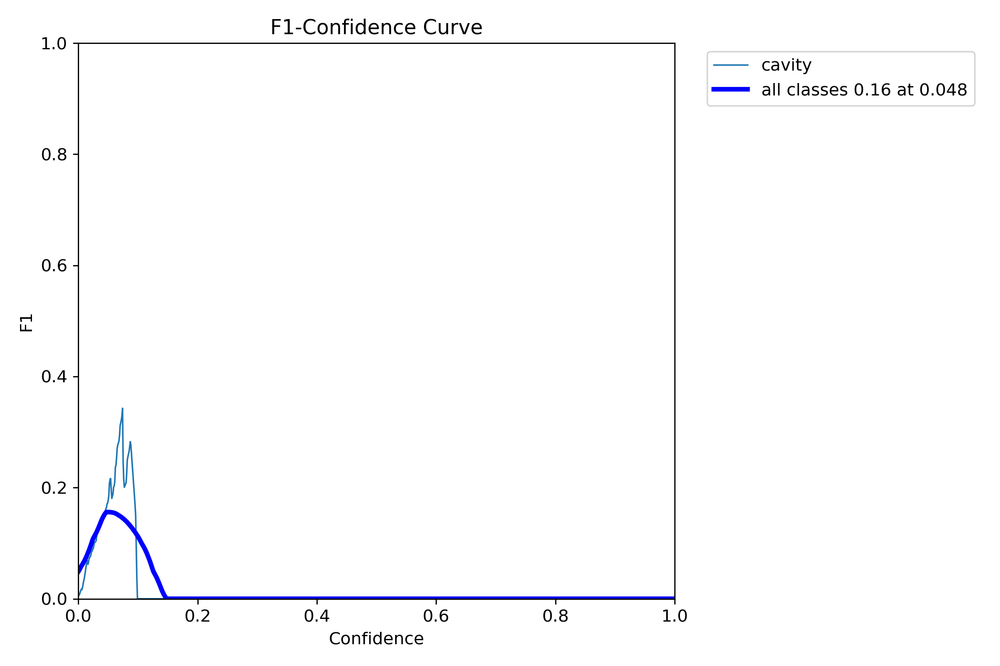

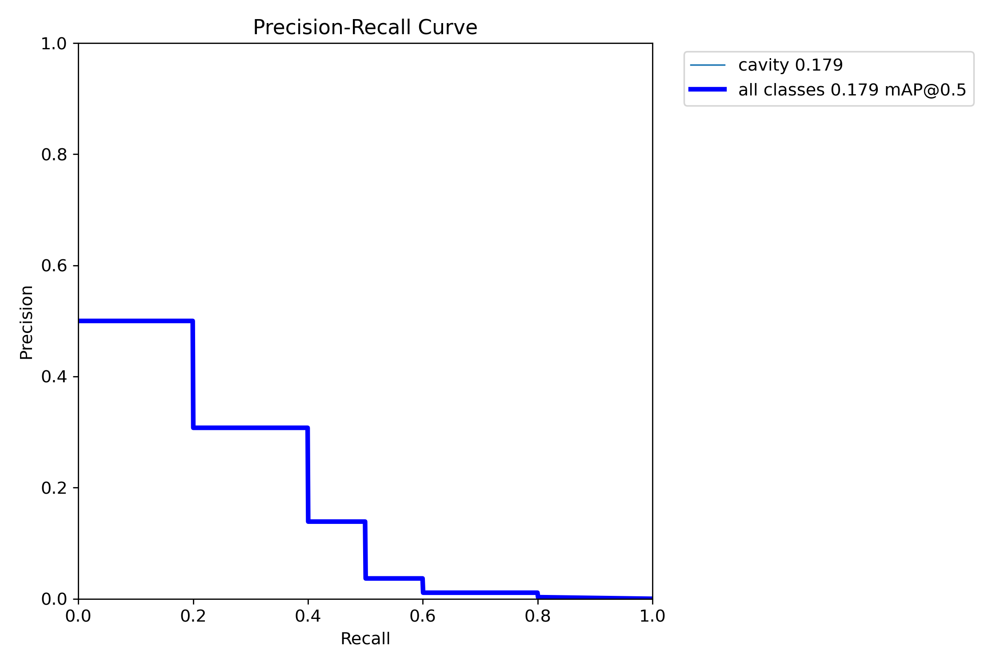

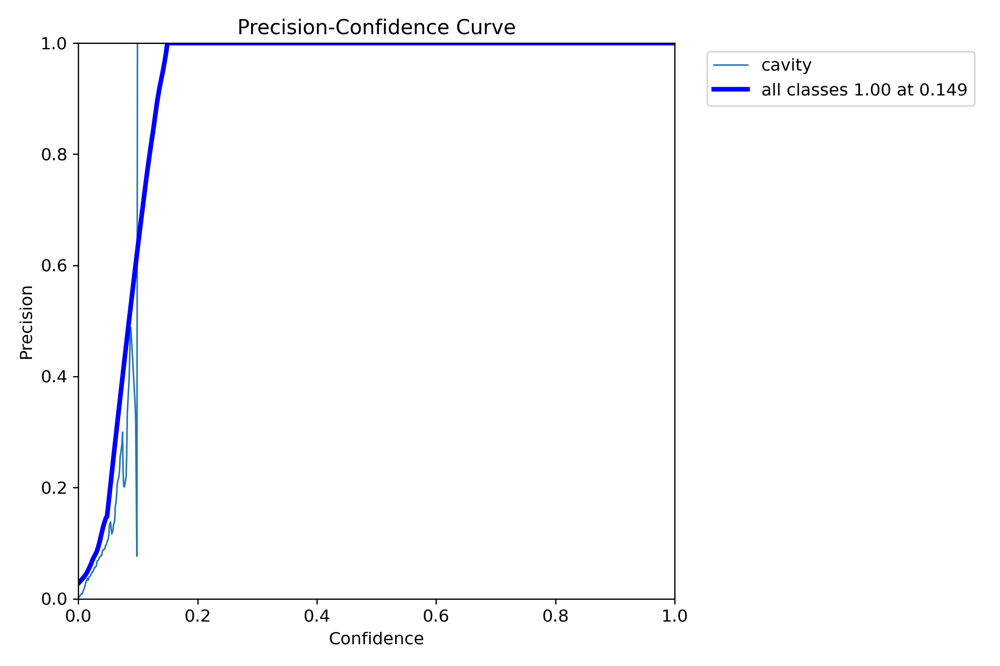

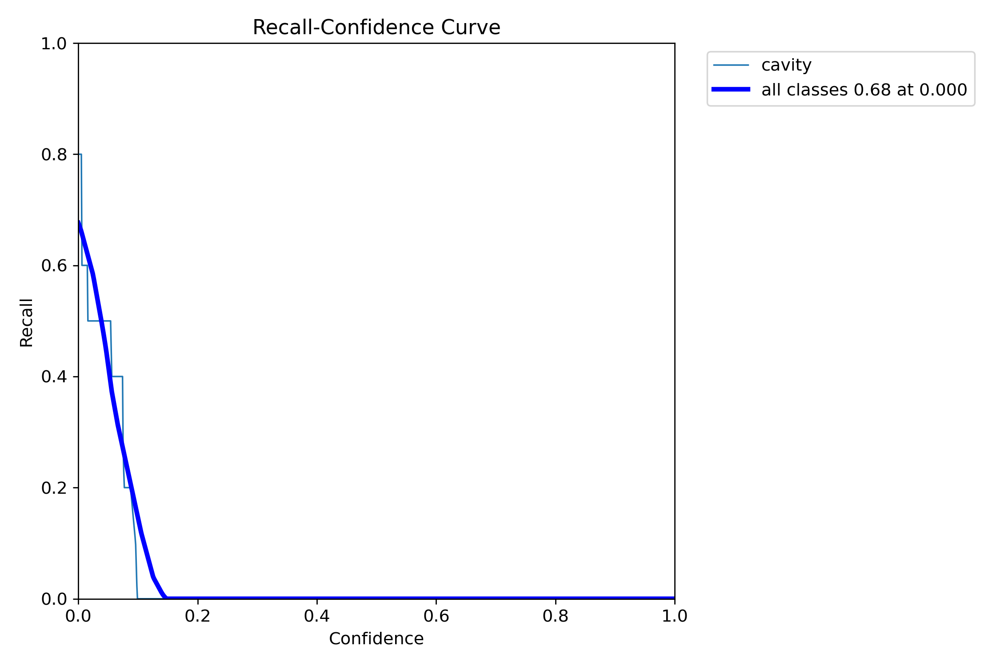

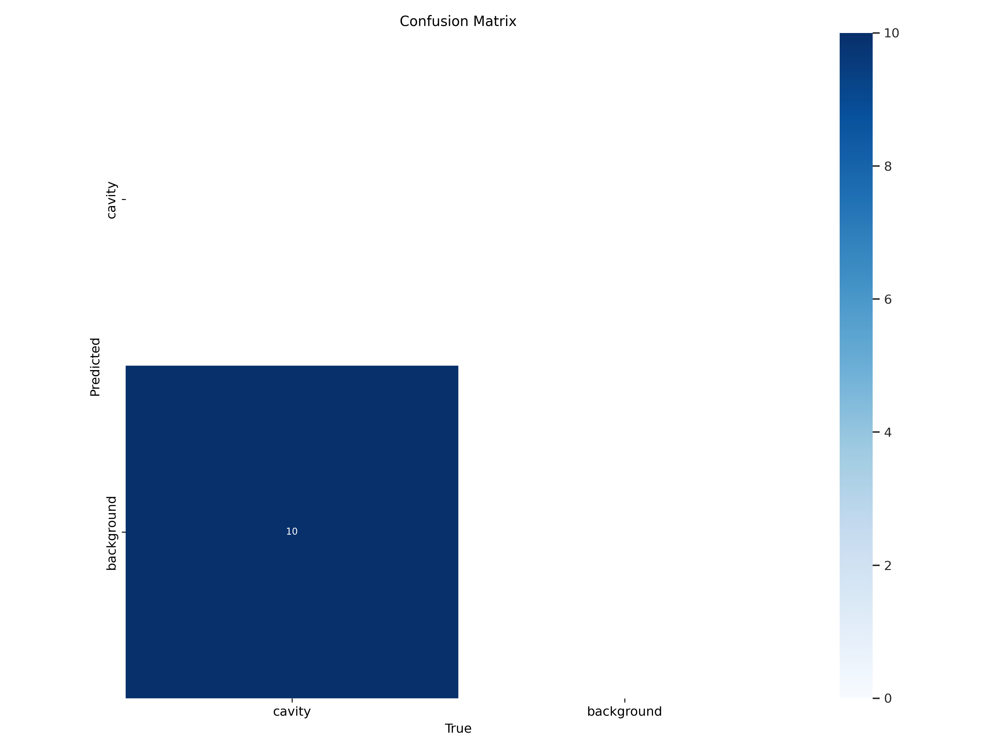

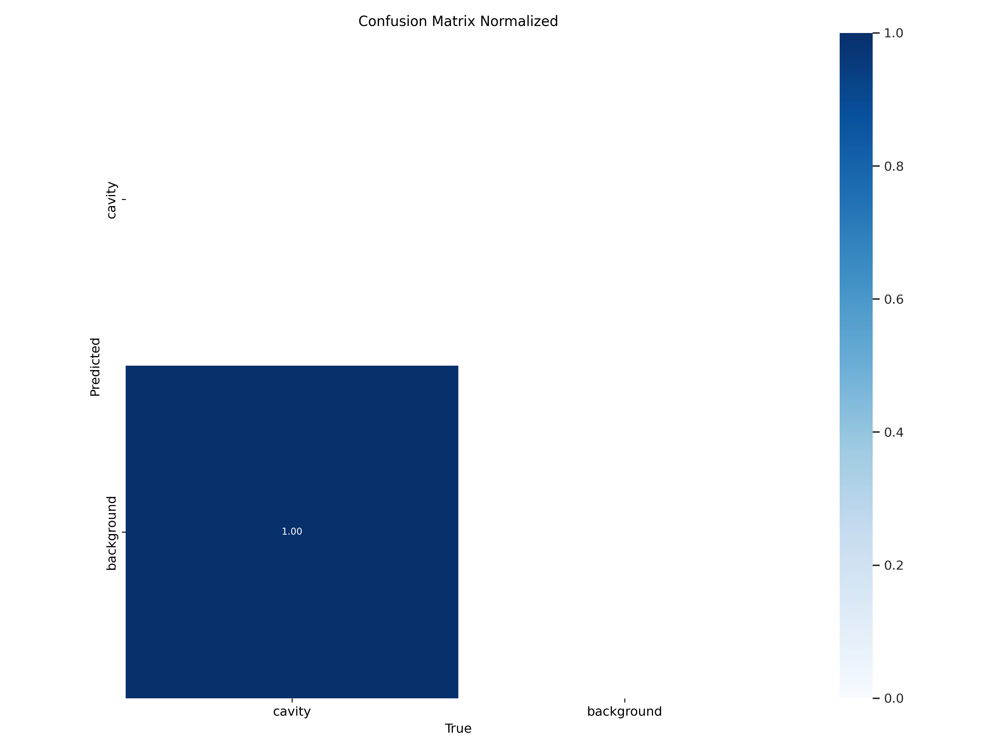

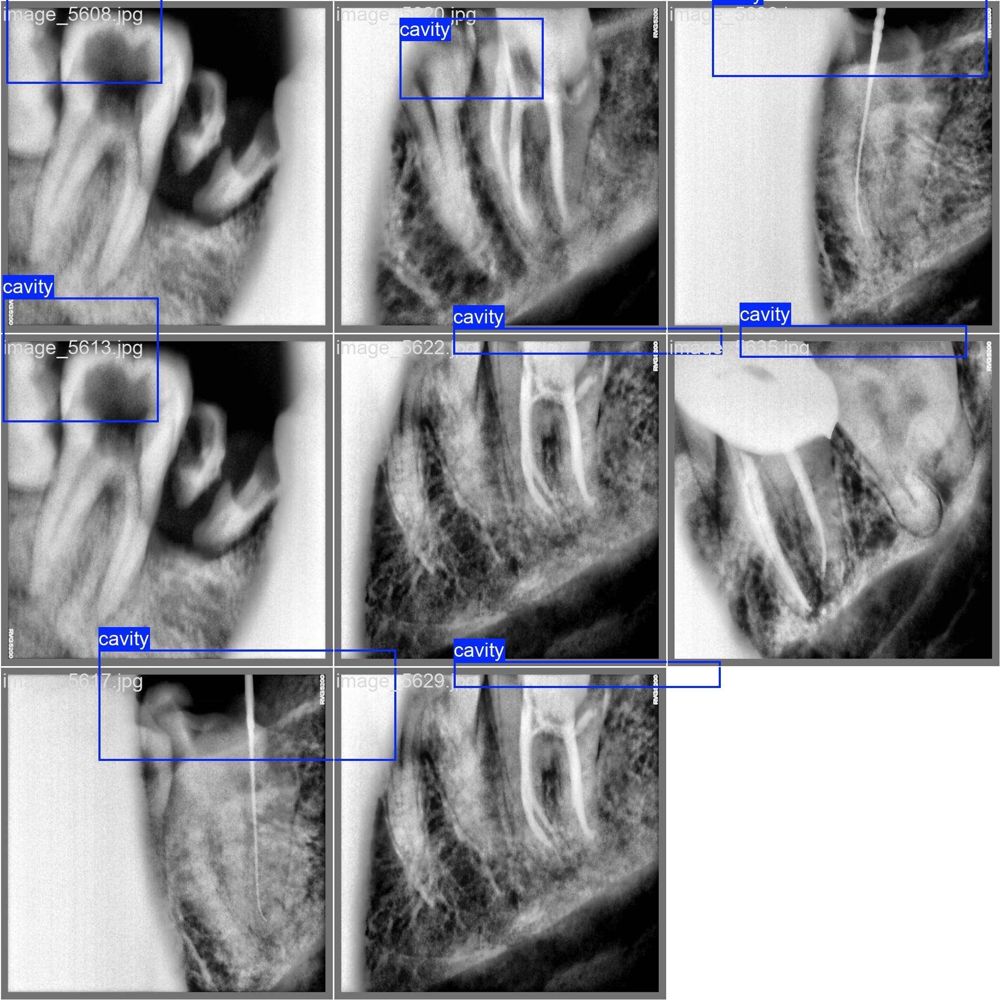

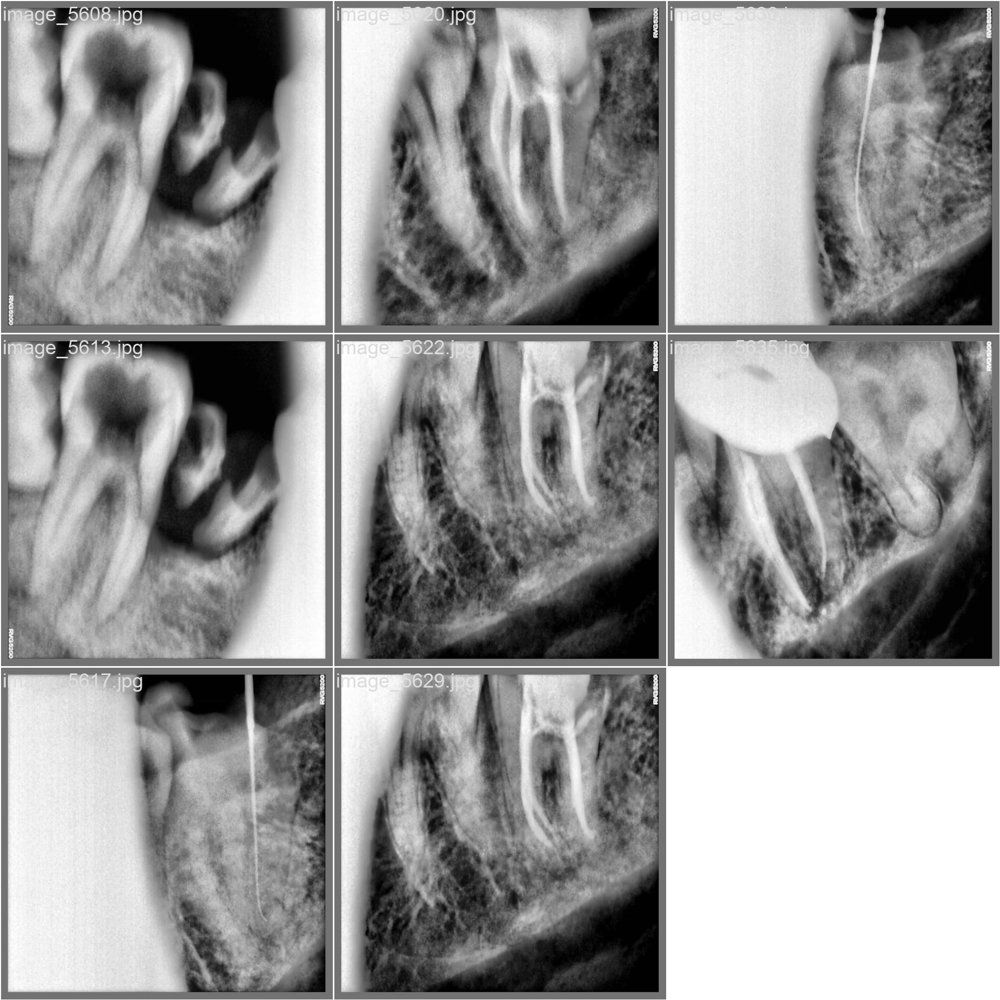

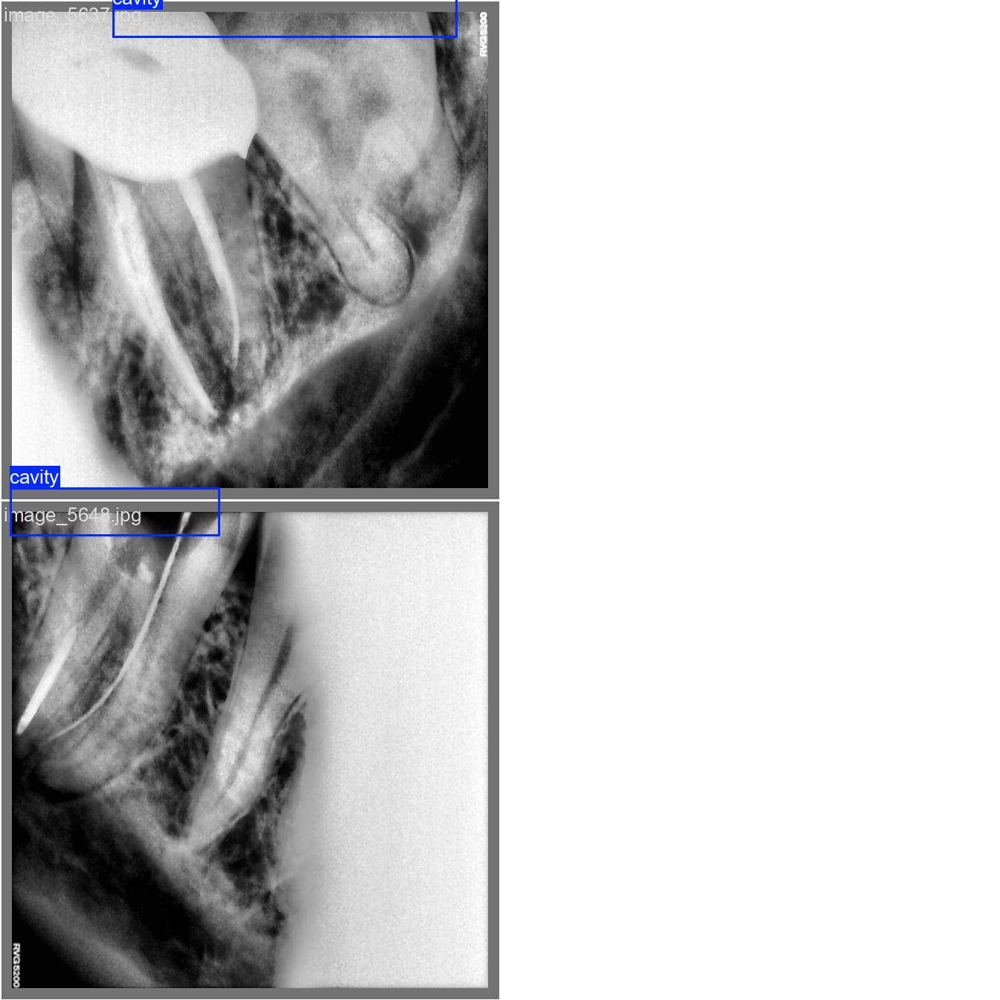

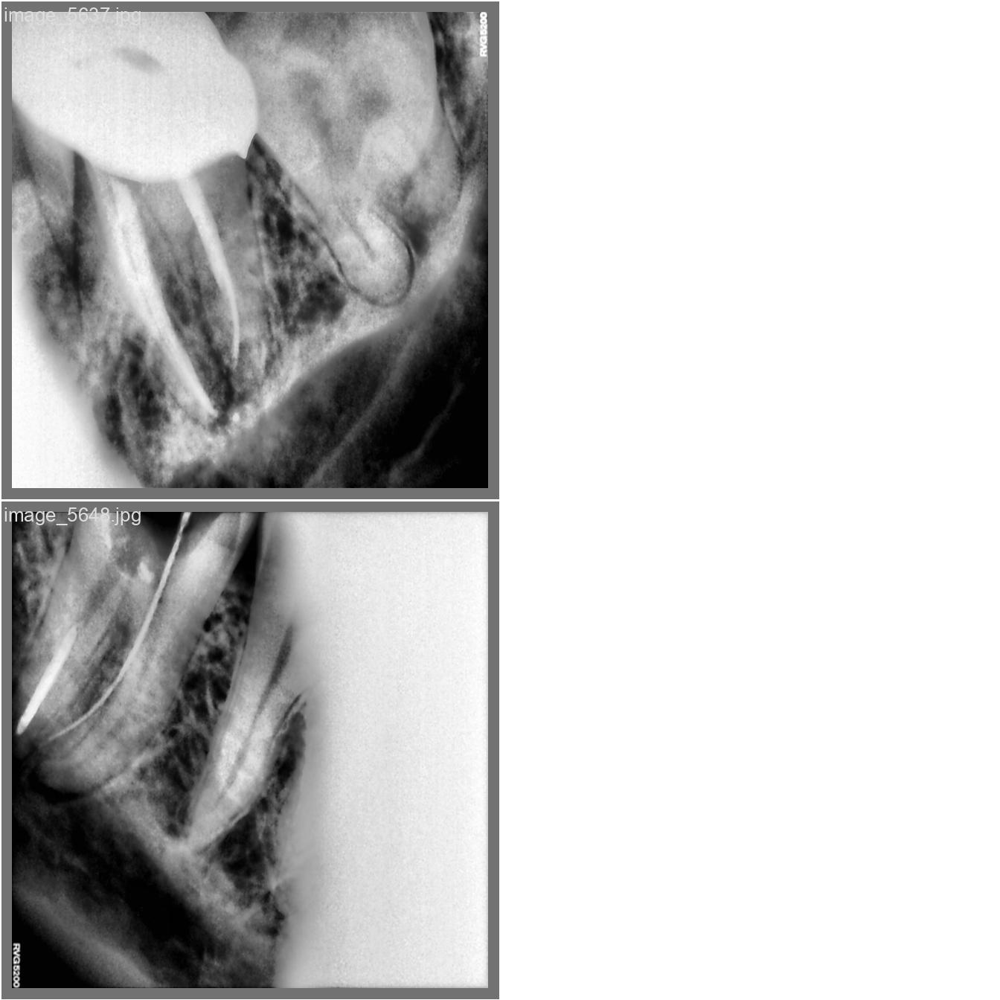

In [76]:
import os
from IPython.display import Image, display

# Set the path where the images are saved
pred_dir = '/kaggle/working/runs/detect/train22'

# Display all predicted images
predicted_images = sorted(os.listdir(pred_dir))
for img_name in predicted_images:
    img_path = os.path.join(pred_dir, img_name)
    display(Image(filename=img_path))


In [53]:
model.predict(
    source='/kaggle/input/cavity-datasets/images/val',
    save=True,
    conf=0.6  # Show only detections with confidence > 0.8
)



image 1/10 /kaggle/input/cavity-datasets/images/val/image_5608.jpg: 640x640 (no detections), 24.9ms
image 2/10 /kaggle/input/cavity-datasets/images/val/image_5613.jpg: 640x640 (no detections), 24.0ms
image 3/10 /kaggle/input/cavity-datasets/images/val/image_5617.jpg: 640x640 (no detections), 24.0ms
image 4/10 /kaggle/input/cavity-datasets/images/val/image_5620.jpg: 640x640 (no detections), 24.1ms
image 5/10 /kaggle/input/cavity-datasets/images/val/image_5622.jpg: 640x640 (no detections), 23.8ms
image 6/10 /kaggle/input/cavity-datasets/images/val/image_5629.jpg: 640x640 (no detections), 23.8ms
image 7/10 /kaggle/input/cavity-datasets/images/val/image_5630.jpg: 640x640 (no detections), 23.8ms
image 8/10 /kaggle/input/cavity-datasets/images/val/image_5635.jpg: 640x640 (no detections), 25.8ms
image 9/10 /kaggle/input/cavity-datasets/images/val/image_5637.jpg: 640x640 (no detections), 22.7ms
image 10/10 /kaggle/input/cavity-datasets/images/val/image_5648.jpg: 640x640 (no detections), 22.7m

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'cavity'}
 obb: None
 orig_img: array([[[ 77,  77,  77],
         [ 80,  80,  80],
         [ 81,  81,  81],
         ...,
         [185, 185, 185],
         [186, 186, 186],
         [184, 184, 184]],
 
        [[101, 101, 101],
         [107, 107, 107],
         [111, 111, 111],
         ...,
         [209, 209, 209],
         [207, 207, 207],
         [203, 203, 203]],
 
        [[116, 116, 116],
         [125, 125, 125],
         [132, 132, 132],
         ...,
         [227, 227, 227],
         [221, 221, 221],
         [214, 214, 214]],
 
        ...,
 
        [[ 74,  74,  74],
         [ 54,  54,  54],
         [166, 166, 166],
         ...,
         [236, 236, 236],
         [233, 233, 233],
         [230, 230, 230]],
 
        [[ 92,  92,  92],
         [ 50,  50,  50],
         [ 88,  88,  88],
         ...,
         [227, 227

In [ ]:
import os
from IPython.display import Image, display

pred_dir = '//kaggle/working/runs/detect/predict3'  # This may change if re-run (e.g., predict2, predict3)

predicted_images = sorted(os.listdir(pred_dir))
for img_name in predicted_images:
    display(Image(filename=os.path.join(pred_dir, img_name)))


## **data augumentaion**

In [8]:
import os

def auto_fix_labels(label_folder, output_folder):
    os.makedirs(output_folder, exist_ok=True)

    for file in os.listdir(label_folder):
        if file.endswith(".txt"):
            filepath = os.path.join(label_folder, file)
            new_lines = []

            with open(filepath, "r") as f:
                lines = f.readlines()
                for idx, line in enumerate(lines):
                    line = line.strip()
                    if not line:
                        continue
                    try:
                        cls, xc, yc, w, h = map(float, line.strip().split())
                    except ValueError:
                        print(f"{file} - Line {idx+1} non-numeric: {line}")
                        continue

                    # Bounding box edges
                    x_min = xc - w / 2
                    x_max = xc + w / 2
                    y_min = yc - h / 2
                    y_max = yc + h / 2

                    # Clip to [0, 1]
                    x_min = max(0, x_min)
                    x_max = min(1, x_max)
                    y_min = max(0, y_min)
                    y_max = min(1, y_max)

                    # Recalculate center and width/height
                    new_xc = (x_min + x_max) / 2
                    new_yc = (y_min + y_max) / 2
                    new_w = x_max - x_min
                    new_h = y_max - y_min

                    if new_w <= 0 or new_h <= 0:
                        print(f"{file} - Line {idx+1} resulted in zero area box: skipped.")
                        continue

                    new_line = f"{int(cls)} {new_xc:.6f} {new_yc:.6f} {new_w:.6f} {new_h:.6f}"
                    new_lines.append(new_line)

            # Save fixed labels
            with open(os.path.join(output_folder, file), "w") as out_f:
                for line in new_lines:
                    out_f.write(line + "\n")
    print("Auto-fix complete.")


label_folder = "/kaggle/input/cavity-datasets/labels/train"
output_folder = "/kaggle/working/fixed_labels"

auto_fix_labels(label_folder, output_folder)


Auto-fix complete.


In [20]:
# Open and read the contents of the file
file_path = '/kaggle/working/labels/train_augmented/aug_1_image_5654.txt'

with open(file_path, 'r') as file:
    content = file.read()

# Display the content
print(content)


0.0 0.665419 0.033164 0.422240 0.066327



In [18]:
import os
import cv2
import albumentations as A
from albumentations.pytorch import ToTensorV2
from tqdm import tqdm

# Define paths
image_dir = "/kaggle/input/cavity-datasets/images/train"
label_dir = "/kaggle/working/fixed_labels"
aug_image_dir = "/kaggle/working/images/train_augmented"
aug_label_dir = "/kaggle/working/labels/train_augmented"

os.makedirs(aug_image_dir, exist_ok=True)
os.makedirs(aug_label_dir, exist_ok=True)

# Define YOLO-style augmentation
transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.2),
    A.Rotate(limit=15, p=0.5),
    A.Resize(640, 640),  # optional resize to YOLO input size
],
bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

# Helper to read YOLO label
def read_yolo_label(label_path):
    bboxes = []
    class_labels = []
    with open(label_path, 'r') as f:
        for line in f.readlines():
            class_id, x_center, y_center, width, height = map(float, line.strip().split())
            bboxes.append([x_center, y_center, width, height])
            class_labels.append(int(class_id))
    return bboxes, class_labels

# Number of augmentations per image
num_augments = 5

# Loop over images
for filename in tqdm(os.listdir(image_dir)):
    if not filename.endswith(('.jpg', '.png')):
        continue

    image_path = os.path.join(image_dir, filename)
    label_path = os.path.join(label_dir, os.path.splitext(filename)[0] + '.txt')

    if not os.path.exists(label_path):
        continue

    image = cv2.imread(image_path)
    height, width = image.shape[:2]

    bboxes, class_labels = read_yolo_label(label_path)

    if len(bboxes) == 0:
        continue  # skip images with no annotations

    # Generate multiple augmented versions for each image
    for i in range(num_augments):
        # Apply augmentation
        try:
            augmented = transform(image=image, bboxes=bboxes, class_labels=class_labels)
        except Exception as e:
            print(f"Skipping {filename} due to error: {e}")
            continue

        aug_image = augmented['image']
        aug_bboxes = augmented['bboxes']
        aug_classes = augmented['class_labels']

        # Save augmented image
        aug_filename = f"aug_{i+1}_{filename}"
        cv2.imwrite(os.path.join(aug_image_dir, aug_filename), aug_image)

        # Save updated label
        with open(os.path.join(aug_label_dir, f"aug_{i+1}_{os.path.splitext(filename)[0]}.txt"), 'w') as f:
            for cls, bbox in zip(aug_classes, aug_bboxes):
                x, y, w, h = bbox
                f.write(f"{cls} {x:.6f} {y:.6f} {w:.6f} {h:.6f}\n")

print("Augmentation complete.")


  3%|▎         | 9/290 [00:00<00:06, 40.85it/s]

Skipping image_5700.jpg due to error: Expected y_min for bbox [ 5.468011e-03 -4.991889e-07  5.476560e-01  1.281245e-01  0.000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_5700.jpg due to error: Expected y_min for bbox [ 5.468011e-03 -4.991889e-07  5.476560e-01  1.281245e-01  0.000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_5700.jpg due to error: Expected y_min for bbox [ 5.468011e-03 -4.991889e-07  5.476560e-01  1.281245e-01  0.000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_5700.jpg due to error: Expected y_min for bbox [ 5.468011e-03 -4.991889e-07  5.476560e-01  1.281245e-01  0.000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_5700.jpg due to error: Expected y_min for bbox [ 5.468011e-03 -4.991889e-07  5.476560e-01  1.281245e-01  0.000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_5987.jpg due to erro

  8%|▊         | 22/290 [00:00<00:05, 46.59it/s]

Skipping image_7468.jpg due to error: Expected y_min for bbox [ 1.14063025e-01 -4.99188900e-07  7.01563001e-01  2.17968494e-01
  0.00000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_7468.jpg due to error: Expected y_min for bbox [ 1.14063025e-01 -4.99188900e-07  7.01563001e-01  2.17968494e-01
  0.00000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_7468.jpg due to error: Expected y_min for bbox [ 1.14063025e-01 -4.99188900e-07  7.01563001e-01  2.17968494e-01
  0.00000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_7468.jpg due to error: Expected y_min for bbox [ 1.14063025e-01 -4.99188900e-07  7.01563001e-01  2.17968494e-01
  0.00000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_7468.jpg due to error: Expected y_min for bbox [ 1.14063025e-01 -4.99188900e-07  7.01563001e-01  2.17968494e-01
  0.00000000e+00] to be in the range [0.0, 1.0], got -4.9

 11%|█         | 32/290 [00:00<00:06, 42.53it/s]

Skipping image_6017.jpg due to error: Expected y_min for bbox [ 5.9375003e-02 -4.9918890e-07  3.4062499e-01  2.0312449e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_6017.jpg due to error: Expected y_min for bbox [ 5.9375003e-02 -4.9918890e-07  3.4062499e-01  2.0312449e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_6017.jpg due to error: Expected y_min for bbox [ 5.9375003e-02 -4.9918890e-07  3.4062499e-01  2.0312449e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_6017.jpg due to error: Expected y_min for bbox [ 5.9375003e-02 -4.9918890e-07  3.4062499e-01  2.0312449e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_6017.jpg due to error: Expected y_min for bbox [ 5.9375003e-02 -4.9918890e-07  3.4062499e-01  2.0312449e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipp

 18%|█▊        | 52/290 [00:01<00:05, 41.90it/s]

Skipping image_7512.jpg due to error: Expected y_min for bbox [ 4.062500e-01 -4.991889e-07  1.000000e+00  1.242185e-01  0.000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_7512.jpg due to error: Expected y_min for bbox [ 4.062500e-01 -4.991889e-07  1.000000e+00  1.242185e-01  0.000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_7512.jpg due to error: Expected y_min for bbox [ 4.062500e-01 -4.991889e-07  1.000000e+00  1.242185e-01  0.000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_7512.jpg due to error: Expected y_min for bbox [ 4.062500e-01 -4.991889e-07  1.000000e+00  1.242185e-01  0.000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_7512.jpg due to error: Expected y_min for bbox [ 4.062500e-01 -4.991889e-07  1.000000e+00  1.242185e-01  0.000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.


 21%|██▏       | 62/290 [00:01<00:05, 41.37it/s]

Skipping image_5900.jpg due to error: Expected x_min for bbox [-5.0663948e-07  6.7968518e-02  5.3046846e-01  9.9999952e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_5900.jpg due to error: Expected x_min for bbox [-5.0663948e-07  6.7968518e-02  5.3046846e-01  9.9999952e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_5900.jpg due to error: Expected x_min for bbox [-5.0663948e-07  6.7968518e-02  5.3046846e-01  9.9999952e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_5900.jpg due to error: Expected x_min for bbox [-5.0663948e-07  6.7968518e-02  5.3046846e-01  9.9999952e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_5900.jpg due to error: Expected x_min for bbox [-5.0663948e-07  6.7968518e-02  5.3046846e-01  9.9999952e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.


 27%|██▋       | 78/290 [00:01<00:05, 41.86it/s]

Skipping image_7425.jpg due to error: Expected y_min for bbox [ 1.960940e-01 -5.066395e-07  1.000000e+00  2.804685e-01  0.000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_7425.jpg due to error: Expected y_min for bbox [ 1.960940e-01 -5.066395e-07  1.000000e+00  2.804685e-01  0.000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_7425.jpg due to error: Expected y_min for bbox [ 1.960940e-01 -5.066395e-07  1.000000e+00  2.804685e-01  0.000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_7425.jpg due to error: Expected y_min for bbox [ 1.960940e-01 -5.066395e-07  1.000000e+00  2.804685e-01  0.000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_7425.jpg due to error: Expected y_min for bbox [ 1.960940e-01 -5.066395e-07  1.000000e+00  2.804685e-01  0.000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_6407.jpg due to erro

 29%|██▊       | 83/290 [00:01<00:04, 41.82it/s]

Skipping image_5849.jpg due to error: Expected x_min for bbox [-4.991889e-07  1.507805e-01  1.242185e-01  6.148435e-01  0.000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_5849.jpg due to error: Expected x_min for bbox [-4.991889e-07  1.507805e-01  1.242185e-01  6.148435e-01  0.000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_5849.jpg due to error: Expected x_min for bbox [-4.991889e-07  1.507805e-01  1.242185e-01  6.148435e-01  0.000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_5849.jpg due to error: Expected x_min for bbox [-4.991889e-07  1.507805e-01  1.242185e-01  6.148435e-01  0.000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_5849.jpg due to error: Expected x_min for bbox [-4.991889e-07  1.507805e-01  1.242185e-01  6.148435e-01  0.000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.


 36%|███▌      | 105/290 [00:02<00:04, 37.54it/s]

Skipping image_7556.jpg due to error: Expected y_min for bbox [ 1.898430e-01 -5.066395e-07  7.007810e-01  3.281245e-01  0.000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_7556.jpg due to error: Expected y_min for bbox [ 1.898430e-01 -5.066395e-07  7.007810e-01  3.281245e-01  0.000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_7556.jpg due to error: Expected y_min for bbox [ 1.898430e-01 -5.066395e-07  7.007810e-01  3.281245e-01  0.000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_7556.jpg due to error: Expected y_min for bbox [ 1.898430e-01 -5.066395e-07  7.007810e-01  3.281245e-01  0.000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_7556.jpg due to error: Expected y_min for bbox [ 1.898430e-01 -5.066395e-07  7.007810e-01  3.281245e-01  0.000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.


 42%|████▏     | 123/290 [00:03<00:04, 40.02it/s]

Skipping image_5754.jpg due to error: Expected x_min for bbox [-5.0663948e-07  1.4765698e-01  1.4921850e-01  9.3671900e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_5754.jpg due to error: Expected x_min for bbox [-5.0663948e-07  1.4765698e-01  1.4921850e-01  9.3671900e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_5754.jpg due to error: Expected x_min for bbox [-5.0663948e-07  1.4765698e-01  1.4921850e-01  9.3671900e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_5754.jpg due to error: Expected x_min for bbox [-5.0663948e-07  1.4765698e-01  1.4921850e-01  9.3671900e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_5754.jpg due to error: Expected x_min for bbox [-5.0663948e-07  1.4765698e-01  1.4921850e-01  9.3671900e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipp

 48%|████▊     | 138/290 [00:03<00:03, 42.45it/s]

Skipping image_5722.jpg due to error: Expected y_min for bbox [ 2.5781250e-01 -5.0105155e-07  9.0468752e-01  5.3124502e-02
  0.0000000e+00] to be in the range [0.0, 1.0], got -5.010515451431274e-07.
Skipping image_5722.jpg due to error: Expected y_min for bbox [ 2.5781250e-01 -5.0105155e-07  9.0468752e-01  5.3124502e-02
  0.0000000e+00] to be in the range [0.0, 1.0], got -5.010515451431274e-07.
Skipping image_5722.jpg due to error: Expected y_min for bbox [ 2.5781250e-01 -5.0105155e-07  9.0468752e-01  5.3124502e-02
  0.0000000e+00] to be in the range [0.0, 1.0], got -5.010515451431274e-07.
Skipping image_5722.jpg due to error: Expected y_min for bbox [ 2.5781250e-01 -5.0105155e-07  9.0468752e-01  5.3124502e-02
  0.0000000e+00] to be in the range [0.0, 1.0], got -5.010515451431274e-07.
Skipping image_5722.jpg due to error: Expected y_min for bbox [ 2.5781250e-01 -5.0105155e-07  9.0468752e-01  5.3124502e-02
  0.0000000e+00] to be in the range [0.0, 1.0], got -5.010515451431274e-07.


 53%|█████▎    | 153/290 [00:03<00:03, 41.43it/s]

Skipping image_7624.jpg due to error: Expected y_min for bbox [ 2.335945e-01 -4.917383e-07  8.945315e-01  3.015625e-01  0.000000e+00] to be in the range [0.0, 1.0], got -4.917383193969727e-07.
Skipping image_7624.jpg due to error: Expected y_min for bbox [ 2.335945e-01 -4.917383e-07  8.945315e-01  3.015625e-01  0.000000e+00] to be in the range [0.0, 1.0], got -4.917383193969727e-07.
Skipping image_7624.jpg due to error: Expected y_min for bbox [ 2.335945e-01 -4.917383e-07  8.945315e-01  3.015625e-01  0.000000e+00] to be in the range [0.0, 1.0], got -4.917383193969727e-07.
Skipping image_7624.jpg due to error: Expected y_min for bbox [ 2.335945e-01 -4.917383e-07  8.945315e-01  3.015625e-01  0.000000e+00] to be in the range [0.0, 1.0], got -4.917383193969727e-07.
Skipping image_7624.jpg due to error: Expected y_min for bbox [ 2.335945e-01 -4.917383e-07  8.945315e-01  3.015625e-01  0.000000e+00] to be in the range [0.0, 1.0], got -4.917383193969727e-07.
Skipping image_6224.jpg due to erro

 57%|█████▋    | 164/290 [00:04<00:02, 44.43it/s]

Skipping image_5690.jpg due to error: Expected y_min for bbox [ 1.6953146e-01 -4.9918890e-07  1.0000005e+00  2.2187451e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_5690.jpg due to error: Expected y_min for bbox [ 1.6953146e-01 -4.9918890e-07  1.0000005e+00  2.2187451e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_5690.jpg due to error: Expected y_min for bbox [ 1.6953146e-01 -4.9918890e-07  1.0000005e+00  2.2187451e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_5690.jpg due to error: Expected y_min for bbox [ 1.6953146e-01 -4.9918890e-07  1.0000005e+00  2.2187451e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_5690.jpg due to error: Expected y_min for bbox [ 1.6953146e-01 -4.9918890e-07  1.0000005e+00  2.2187451e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipp

 61%|██████    | 176/290 [00:04<00:02, 47.13it/s]

Skipping image_6114.jpg due to error: Expected y_min for bbox [ 2.3437500e-02 -4.9918890e-07  3.8906249e-01  1.9921851e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_6114.jpg due to error: Expected y_min for bbox [ 2.3437500e-02 -4.9918890e-07  3.8906249e-01  1.9921851e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_6114.jpg due to error: Expected y_min for bbox [ 2.3437500e-02 -4.9918890e-07  3.8906249e-01  1.9921851e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_6114.jpg due to error: Expected y_min for bbox [ 2.3437500e-02 -4.9918890e-07  3.8906249e-01  1.9921851e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_6114.jpg due to error: Expected y_min for bbox [ 2.3437500e-02 -4.9918890e-07  3.8906249e-01  1.9921851e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.


 64%|██████▍   | 187/290 [00:04<00:02, 46.50it/s]

Skipping image_5736.jpg due to error: Expected y_min for bbox [ 3.1245053e-03 -5.0663948e-07  6.9999945e-01  2.7421850e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_5736.jpg due to error: Expected y_min for bbox [ 3.1245053e-03 -5.0663948e-07  6.9999945e-01  2.7421850e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_5736.jpg due to error: Expected y_min for bbox [ 3.1245053e-03 -5.0663948e-07  6.9999945e-01  2.7421850e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_5736.jpg due to error: Expected y_min for bbox [ 3.1245053e-03 -5.0663948e-07  6.9999945e-01  2.7421850e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_5736.jpg due to error: Expected y_min for bbox [ 3.1245053e-03 -5.0663948e-07  6.9999945e-01  2.7421850e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipp

 70%|██████▉   | 202/290 [00:04<00:02, 42.52it/s]

Skipping image_6498.jpg due to error: Expected y_min for bbox [ 0.000000e+00 -5.029142e-07  4.062500e-01  1.203125e-01  0.000000e+00] to be in the range [0.0, 1.0], got -5.029141902923584e-07.
Skipping image_6498.jpg due to error: Expected y_min for bbox [ 0.000000e+00 -5.029142e-07  4.062500e-01  1.203125e-01  0.000000e+00] to be in the range [0.0, 1.0], got -5.029141902923584e-07.
Skipping image_6498.jpg due to error: Expected y_min for bbox [ 0.000000e+00 -5.029142e-07  4.062500e-01  1.203125e-01  0.000000e+00] to be in the range [0.0, 1.0], got -5.029141902923584e-07.
Skipping image_6498.jpg due to error: Expected y_min for bbox [ 0.000000e+00 -5.029142e-07  4.062500e-01  1.203125e-01  0.000000e+00] to be in the range [0.0, 1.0], got -5.029141902923584e-07.
Skipping image_6498.jpg due to error: Expected y_min for bbox [ 0.000000e+00 -5.029142e-07  4.062500e-01  1.203125e-01  0.000000e+00] to be in the range [0.0, 1.0], got -5.029141902923584e-07.


 78%|███████▊  | 227/290 [00:05<00:01, 42.46it/s]

Skipping image_7542.jpg due to error: Expected y_min for bbox [ 5.066395e-07 -4.991889e-07  4.132815e-01  8.046850e-02  0.000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_7542.jpg due to error: Expected y_min for bbox [ 5.066395e-07 -4.991889e-07  4.132815e-01  8.046850e-02  0.000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_7542.jpg due to error: Expected y_min for bbox [ 5.066395e-07 -4.991889e-07  4.132815e-01  8.046850e-02  0.000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_7542.jpg due to error: Expected y_min for bbox [ 5.066395e-07 -4.991889e-07  4.132815e-01  8.046850e-02  0.000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_7542.jpg due to error: Expected y_min for bbox [ 5.066395e-07 -4.991889e-07  4.132815e-01  8.046850e-02  0.000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_6228.jpg due to erro

 82%|████████▏ | 238/290 [00:05<00:01, 44.22it/s]

Skipping image_7460.jpg due to error: Expected y_min for bbox [ 0.000000e+00 -5.066395e-07  5.187500e-01  3.781245e-01  0.000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_7460.jpg due to error: Expected y_min for bbox [ 0.000000e+00 -5.066395e-07  5.187500e-01  3.781245e-01  0.000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_7460.jpg due to error: Expected y_min for bbox [ 0.000000e+00 -5.066395e-07  5.187500e-01  3.781245e-01  0.000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_7460.jpg due to error: Expected y_min for bbox [ 0.000000e+00 -5.066395e-07  5.187500e-01  3.781245e-01  0.000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_7460.jpg due to error: Expected y_min for bbox [ 0.000000e+00 -5.066395e-07  5.187500e-01  3.781245e-01  0.000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_6065.jpg due to erro

 87%|████████▋ | 253/290 [00:06<00:00, 42.51it/s]

Skipping image_5789.jpg due to error: Expected x_min for bbox [-5.0663948e-07  4.9918890e-07  5.9921849e-01  1.6718751e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_5789.jpg due to error: Expected x_min for bbox [-5.0663948e-07  4.9918890e-07  5.9921849e-01  1.6718751e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_5789.jpg due to error: Expected x_min for bbox [-5.0663948e-07  4.9918890e-07  5.9921849e-01  1.6718751e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_5789.jpg due to error: Expected x_min for bbox [-5.0663948e-07  4.9918890e-07  5.9921849e-01  1.6718751e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipping image_5789.jpg due to error: Expected x_min for bbox [-5.0663948e-07  4.9918890e-07  5.9921849e-01  1.6718751e-01
  0.0000000e+00] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Skipp

 94%|█████████▍| 273/290 [00:06<00:00, 42.22it/s]

Skipping image_5697.jpg due to error: Expected y_min for bbox [ 0.000000e+00 -4.991889e-07  5.109380e-01  8.671850e-02  0.000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_5697.jpg due to error: Expected y_min for bbox [ 0.000000e+00 -4.991889e-07  5.109380e-01  8.671850e-02  0.000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_5697.jpg due to error: Expected y_min for bbox [ 0.000000e+00 -4.991889e-07  5.109380e-01  8.671850e-02  0.000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_5697.jpg due to error: Expected y_min for bbox [ 0.000000e+00 -4.991889e-07  5.109380e-01  8.671850e-02  0.000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_5697.jpg due to error: Expected y_min for bbox [ 0.000000e+00 -4.991889e-07  5.109380e-01  8.671850e-02  0.000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_5907.jpg due to erro

 96%|█████████▌| 278/290 [00:06<00:00, 42.36it/s]

Skipping image_5998.jpg due to error: Expected y_min for bbox [ 5.0663948e-07 -4.9918890e-07  5.0468755e-01  5.7812501e-02
  0.0000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_5998.jpg due to error: Expected y_min for bbox [ 5.0663948e-07 -4.9918890e-07  5.0468755e-01  5.7812501e-02
  0.0000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_5998.jpg due to error: Expected y_min for bbox [ 5.0663948e-07 -4.9918890e-07  5.0468755e-01  5.7812501e-02
  0.0000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_5998.jpg due to error: Expected y_min for bbox [ 5.0663948e-07 -4.9918890e-07  5.0468755e-01  5.7812501e-02
  0.0000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Skipping image_5998.jpg due to error: Expected y_min for bbox [ 5.0663948e-07 -4.9918890e-07  5.0468755e-01  5.7812501e-02
  0.0000000e+00] to be in the range [0.0, 1.0], got -4.991888999938965e-07.


 99%|█████████▉| 287/290 [00:06<00:00, 34.34it/s]

Skipping image_6276.jpg due to error: Expected y_min for bbox [ 1.101560e-01 -4.917383e-07  8.835940e-01  3.718745e-01  0.000000e+00] to be in the range [0.0, 1.0], got -4.917383193969727e-07.
Skipping image_6276.jpg due to error: Expected y_min for bbox [ 1.101560e-01 -4.917383e-07  8.835940e-01  3.718745e-01  0.000000e+00] to be in the range [0.0, 1.0], got -4.917383193969727e-07.
Skipping image_6276.jpg due to error: Expected y_min for bbox [ 1.101560e-01 -4.917383e-07  8.835940e-01  3.718745e-01  0.000000e+00] to be in the range [0.0, 1.0], got -4.917383193969727e-07.
Skipping image_6276.jpg due to error: Expected y_min for bbox [ 1.101560e-01 -4.917383e-07  8.835940e-01  3.718745e-01  0.000000e+00] to be in the range [0.0, 1.0], got -4.917383193969727e-07.
Skipping image_6276.jpg due to error: Expected y_min for bbox [ 1.101560e-01 -4.917383e-07  8.835940e-01  3.718745e-01  0.000000e+00] to be in the range [0.0, 1.0], got -4.917383193969727e-07.


100%|██████████| 290/290 [00:07<00:00, 41.02it/s]

Augmentation complete.


In [19]:
import os

# Path to the directory
directory = '/kaggle/working/images/train_augmented'

# List of common image extensions
image_extensions = ['.jpg', '.jpeg', '.png', '.gif', '.bmp', '.tiff', '.webp']

# List all files in the directory
files = os.listdir(directory)

# Filter and count image files
image_files = [f for f in files if os.path.splitext(f)[1].lower() in image_extensions]

# Print the count of image files
print(f"Number of images in the directory: {len(image_files)}")


Number of images in the directory: 1495


In [22]:
import os
import cv2
import albumentations as A
from tqdm import tqdm

# Define paths
mask_image_dir = "/kaggle/input/cavity-datasets/masks/train"  # For original mask images
aug_mask_dir = "/kaggle/working/mask_images/train_augmented"  # Augmented mask images

os.makedirs(aug_mask_dir, exist_ok=True)

# Define YOLO-style augmentation (you can use the same transform)
transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.2),
    A.Rotate(limit=15, p=0.5),
    A.Resize(640, 640),  # Resize to desired size (if needed for segmentation)
    A.RandomCrop(height=640, width=640, p=0.5),
    A.PadIfNeeded(min_height=640, min_width=640)  # Fixed: removed `always_apply`
])

# Number of augmentations per image
num_augments = 5

# Loop over mask images
for filename in tqdm(os.listdir(mask_image_dir)):
    if not filename.endswith(('.jpg', '.png')):
        continue

    mask_path = os.path.join(mask_image_dir, filename)  # Path to the corresponding mask image

    if not os.path.exists(mask_path):  # Only check for the mask
        continue

    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Read the mask as grayscale

    # Generate multiple augmented versions for each mask image
    for i in range(num_augments):
        # Apply augmentation
        try:
            augmented = transform(image=mask)  # Only augment the mask
        except Exception as e:
            print(f"Skipping {filename} due to error: {e}")
            continue

        aug_mask = augmented['image']

        # Save augmented mask
        aug_mask_filename = f"aug_{i+1}_{filename}"
        cv2.imwrite(os.path.join(aug_mask_dir, aug_mask_filename), aug_mask)

print("Mask image augmentation complete.")


100%|██████████| 290/290 [00:07<00:00, 36.56it/s]

Mask image augmentation complete.


**yml file create and save for model training**

In [25]:
# Define the content of the YAML file
data_yaml = """
path: /kaggle/input/aug-dataset
train: images/train
val: images/train

nc: 1
names: ['cavity']
"""

# Write the YAML content to a file
with open("data.yml", "w") as f:
    f.write(data_yaml)

# Optional: Print confirmation
print("✅ 'data.yml' has been created and saved successfully.")

✅ 'data.yml' has been created and saved successfully.


### **training the Yolov8 small model with augmented images**

In [1]:
from ultralytics import YOLO

model = YOLO('yolov8s.pt') 

model.train(
    data='/kaggle/working/data.yml',
    epochs=100,
    imgsz=640,
    batch=8,
    device=0,           # GPU if available
    augment=True,       # enables built-in strong augmentations
    patience=20,        # early stopping if no improvement
    cos_lr=True         # cosine learning rate scheduling
)


Ultralytics 8.3.123 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/kaggle/working/data.yml, epochs=100, time=None, patience=20, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_w

train: Scanning /kaggle/input/aug-dataset/labels/train... 1495 images, 1 backgrounds, 0 corrupt: 100%|██████████| 1495/1495 [00:05<00:00, 284.63it/s]


WARNING ⚠️ train: Cache directory /kaggle/input/aug-dataset/labels is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 80.7±56.1 MB/s, size: 94.2 KB)


val: Scanning /kaggle/input/aug-dataset/labels/train... 1495 images, 1 backgrounds, 0 corrupt: 100%|██████████| 1495/1495 [00:01<00:00, 875.60it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/aug-dataset/labels is not writeable, cache not saved.


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train2
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.19G      1.838      2.803      2.063         16        640: 100%|██████████| 187/187 [00:35<00:00,  5.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:14<00:00,  6.52it/s]


                   all       1495       1524    0.00612      0.633    0.00541    0.00225

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.45G      1.926      2.504      2.122         18        640: 100%|██████████| 187/187 [00:33<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.44it/s]


                   all       1495       1524     0.0163      0.215     0.0107    0.00294

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.46G      1.869      2.495      2.103         14        640: 100%|██████████| 187/187 [00:33<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.39it/s]


                   all       1495       1524      0.192      0.297      0.155     0.0521

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.46G      1.819      2.463      2.057         16        640: 100%|██████████| 187/187 [00:32<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.33it/s]


                   all       1495       1524      0.127      0.354      0.101     0.0333

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.46G      1.748      2.397      2.002         14        640: 100%|██████████| 187/187 [00:32<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.35it/s]

                   all       1495       1524      0.232      0.473      0.237     0.0917



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.46G      1.739      2.297      1.959         10        640: 100%|██████████| 187/187 [00:33<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.40it/s]

                   all       1495       1524       0.27      0.433       0.25     0.0908



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.46G      1.707      2.277      1.923         14        640: 100%|██████████| 187/187 [00:32<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.34it/s]

                   all       1495       1524      0.245      0.358      0.237     0.0767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.46G      1.672      2.269      1.931         16        640: 100%|██████████| 187/187 [00:32<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.37it/s]

                   all       1495       1524      0.268      0.364      0.272      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.46G      1.671      2.218      1.908         19        640: 100%|██████████| 187/187 [00:33<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.36it/s]

                   all       1495       1524      0.243      0.428      0.271      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.46G       1.65      2.237      1.894         12        640: 100%|██████████| 187/187 [00:32<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.42it/s]

                   all       1495       1524      0.294       0.39      0.277      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.46G      1.653      2.188      1.912         15        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.35it/s]

                   all       1495       1524      0.307       0.41      0.326      0.128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.46G      1.617      2.197      1.877         18        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.39it/s]

                   all       1495       1524      0.332      0.443      0.296      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      2.46G      1.589      2.147      1.867         12        640: 100%|██████████| 187/187 [00:32<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.45it/s]


                   all       1495       1524       0.32      0.441      0.309      0.117

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.46G      1.596      2.148      1.855         11        640: 100%|██████████| 187/187 [00:32<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.40it/s]


                   all       1495       1524      0.374      0.399      0.388      0.155

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.46G      1.594      2.112      1.843         16        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.33it/s]


                   all       1495       1524      0.355      0.498      0.371      0.149

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.46G      1.575      2.107      1.846         13        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.39it/s]

                   all       1495       1524      0.368      0.441      0.325      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.46G      1.566      2.084      1.834         13        640: 100%|██████████| 187/187 [00:33<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.41it/s]

                   all       1495       1524      0.394      0.385      0.343       0.13



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      2.46G      1.557      2.095      1.826         14        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.33it/s]

                   all       1495       1524      0.391      0.434      0.397      0.167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.46G      1.528      2.082      1.813         21        640: 100%|██████████| 187/187 [00:33<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.28it/s]


                   all       1495       1524      0.476      0.459      0.453       0.19

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.46G      1.557      2.007      1.807         17        640: 100%|██████████| 187/187 [00:33<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.42it/s]

                   all       1495       1524       0.42      0.454       0.41      0.167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      2.46G       1.55      2.053      1.817         19        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.41it/s]

                   all       1495       1524      0.417      0.428      0.407      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.46G      1.502       2.01      1.789         12        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.40it/s]

                   all       1495       1524      0.421      0.439      0.432      0.193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.46G      1.513      1.977      1.782         13        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.40it/s]

                   all       1495       1524      0.493      0.432      0.438      0.163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.46G      1.511      1.973       1.79         19        640: 100%|██████████| 187/187 [00:33<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.42it/s]

                   all       1495       1524      0.477      0.486      0.485      0.215



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.46G      1.479      1.967      1.768         19        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.34it/s]

                   all       1495       1524      0.524      0.412      0.483      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.46G      1.491      1.954      1.783         15        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.37it/s]

                   all       1495       1524      0.516      0.476      0.524      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.46G      1.464      1.929      1.749         11        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.34it/s]

                   all       1495       1524      0.557      0.535      0.531       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.46G      1.471      1.935      1.762         13        640: 100%|██████████| 187/187 [00:32<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.45it/s]

                   all       1495       1524      0.496      0.509      0.483      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      2.46G      1.463      1.928       1.74         17        640: 100%|██████████| 187/187 [00:32<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.42it/s]

                   all       1495       1524      0.492      0.576      0.518      0.249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.46G      1.463      1.896      1.745         11        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.36it/s]

                   all       1495       1524      0.522      0.568      0.537      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      2.46G      1.435      1.861      1.724         11        640: 100%|██████████| 187/187 [00:33<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.48it/s]

                   all       1495       1524       0.51      0.551      0.534      0.257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.46G      1.426      1.879      1.701         17        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.33it/s]


                   all       1495       1524       0.51      0.615      0.542      0.237

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.46G      1.418      1.796      1.707         18        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.34it/s]

                   all       1495       1524      0.594      0.581      0.601      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.46G       1.39        1.8      1.684         17        640: 100%|██████████| 187/187 [00:33<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.26it/s]

                   all       1495       1524      0.601      0.562      0.606       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.46G      1.382      1.774      1.687         12        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.40it/s]

                   all       1495       1524       0.65      0.596      0.625      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.46G      1.373      1.755      1.677         16        640: 100%|██████████| 187/187 [00:33<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.27it/s]

                   all       1495       1524      0.605      0.597      0.638      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.46G        1.4       1.79        1.7         14        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.38it/s]

                   all       1495       1524      0.641      0.621      0.651       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.46G      1.352      1.768      1.666         11        640: 100%|██████████| 187/187 [00:32<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.30it/s]

                   all       1495       1524      0.657      0.623      0.698      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.46G      1.365      1.717      1.671         13        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.42it/s]

                   all       1495       1524      0.692       0.62      0.707      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.46G      1.341      1.673      1.646         15        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.31it/s]

                   all       1495       1524       0.65      0.652       0.67      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.46G      1.342      1.693      1.662         11        640: 100%|██████████| 187/187 [00:33<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.34it/s]

                   all       1495       1524      0.666      0.661      0.718        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      2.46G      1.324      1.677      1.631         19        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.29it/s]

                   all       1495       1524      0.637      0.647      0.703      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.46G      1.328      1.634      1.638         14        640: 100%|██████████| 187/187 [00:33<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:13<00:00,  7.23it/s]

                   all       1495       1524      0.706      0.684      0.759      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.46G      1.281      1.615      1.605         20        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.45it/s]

                   all       1495       1524      0.654       0.66      0.725      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.46G      1.289      1.587       1.61         12        640: 100%|██████████| 187/187 [00:32<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.28it/s]

                   all       1495       1524      0.738      0.685      0.765      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.46G      1.284      1.567      1.592         17        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.30it/s]


                   all       1495       1524      0.758      0.713      0.805      0.473

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      2.46G      1.257      1.499      1.584         14        640: 100%|██████████| 187/187 [00:33<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:13<00:00,  7.20it/s]

                   all       1495       1524      0.734      0.696      0.775      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.46G      1.258      1.496      1.585         15        640: 100%|██████████| 187/187 [00:33<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:13<00:00,  7.12it/s]

                   all       1495       1524      0.737      0.792       0.82      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      2.46G       1.24      1.468      1.561         17        640: 100%|██████████| 187/187 [00:33<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.33it/s]

                   all       1495       1524      0.818      0.741      0.852      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      2.46G       1.25      1.476      1.575         12        640: 100%|██████████| 187/187 [00:33<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.46it/s]

                   all       1495       1524      0.804      0.787      0.869      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.46G      1.228      1.467      1.558         25        640: 100%|██████████| 187/187 [00:32<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.43it/s]

                   all       1495       1524      0.757      0.756       0.84      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.46G       1.21      1.433      1.536         12        640: 100%|██████████| 187/187 [00:32<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.49it/s]


                   all       1495       1524      0.839      0.817      0.892      0.581

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.46G      1.209      1.366      1.538         12        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.45it/s]

                   all       1495       1524       0.81      0.801      0.871      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.46G      1.202      1.382      1.523         14        640: 100%|██████████| 187/187 [00:32<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.42it/s]

                   all       1495       1524      0.867      0.791      0.899      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.46G      1.188      1.383      1.527         20        640: 100%|██████████| 187/187 [00:32<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.31it/s]

                   all       1495       1524      0.851      0.814      0.906      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      2.46G       1.18      1.348       1.51         15        640: 100%|██████████| 187/187 [00:32<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.38it/s]

                   all       1495       1524      0.818      0.847      0.903      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      2.46G      1.153      1.303      1.493         20        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.37it/s]

                   all       1495       1524      0.814      0.852      0.911      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.46G       1.14      1.289      1.476         16        640: 100%|██████████| 187/187 [00:33<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.40it/s]


                   all       1495       1524       0.86      0.837      0.921      0.645

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      2.46G      1.147      1.263      1.485         17        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.27it/s]

                   all       1495       1524      0.854       0.85      0.923      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.46G      1.146      1.262      1.484         17        640: 100%|██████████| 187/187 [00:33<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.40it/s]

                   all       1495       1524        0.9      0.866      0.944      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.46G      1.115       1.26      1.465         10        640: 100%|██████████| 187/187 [00:33<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:13<00:00,  7.21it/s]

                   all       1495       1524      0.917      0.866      0.947      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      2.46G      1.081      1.191       1.44         15        640: 100%|██████████| 187/187 [00:33<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.38it/s]

                   all       1495       1524      0.909      0.877      0.947      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      2.46G       1.07      1.191      1.421         11        640: 100%|██████████| 187/187 [00:33<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.53it/s]

                   all       1495       1524      0.891      0.887      0.948      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      2.46G      1.056      1.171      1.413         11        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.31it/s]

                   all       1495       1524      0.917      0.896      0.961       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      2.46G      1.058       1.16      1.412         13        640: 100%|██████████| 187/187 [00:33<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.44it/s]


                   all       1495       1524      0.891      0.904      0.957      0.705

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.46G      1.065      1.145      1.412         10        640: 100%|██████████| 187/187 [00:33<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.42it/s]

                   all       1495       1524      0.932       0.88      0.958      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      2.46G      1.047      1.122      1.403         15        640: 100%|██████████| 187/187 [00:33<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.34it/s]

                   all       1495       1524      0.944        0.9      0.967       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.46G      1.013      1.082      1.379         14        640: 100%|██████████| 187/187 [00:33<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.24it/s]

                   all       1495       1524      0.941      0.909      0.969      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      2.46G          1      1.083      1.371         14        640: 100%|██████████| 187/187 [00:33<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.27it/s]

                   all       1495       1524      0.935      0.923      0.971      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      2.46G     0.9791      1.044      1.356         20        640: 100%|██████████| 187/187 [00:33<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.28it/s]

                   all       1495       1524       0.93      0.915      0.969       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.46G      1.003      1.063      1.372         12        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.53it/s]

                   all       1495       1524      0.947      0.921      0.973      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      2.46G     0.9825      1.023      1.361         19        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.42it/s]

                   all       1495       1524      0.948      0.924      0.975      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      2.46G     0.9886       1.02      1.365         14        640: 100%|██████████| 187/187 [00:33<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.46it/s]

                   all       1495       1524      0.954       0.93      0.976      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      2.46G      0.964      1.016      1.346         14        640: 100%|██████████| 187/187 [00:32<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.53it/s]

                   all       1495       1524      0.945      0.942      0.978      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      2.46G     0.9504     0.9926      1.333         19        640: 100%|██████████| 187/187 [00:32<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.39it/s]

                   all       1495       1524      0.963      0.932      0.977      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      2.46G     0.9536      0.983      1.345         13        640: 100%|██████████| 187/187 [00:33<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.57it/s]

                   all       1495       1524      0.951      0.945       0.98      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      2.46G     0.9345      0.963      1.328          8        640: 100%|██████████| 187/187 [00:32<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.50it/s]

                   all       1495       1524      0.954      0.943      0.981      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      2.46G     0.9369      0.943      1.316         15        640: 100%|██████████| 187/187 [00:33<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.59it/s]

                   all       1495       1524      0.959      0.953      0.978       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      2.46G     0.9254     0.9629      1.316          8        640: 100%|██████████| 187/187 [00:32<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.58it/s]

                   all       1495       1524      0.961      0.946       0.98      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      2.46G     0.9102     0.9339      1.305         18        640: 100%|██████████| 187/187 [00:33<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.53it/s]

                   all       1495       1524      0.967      0.951      0.984      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      2.46G     0.9104     0.9198      1.289         18        640: 100%|██████████| 187/187 [00:32<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.61it/s]

                   all       1495       1524       0.95      0.952      0.984      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.46G     0.8842     0.9322        1.3         15        640: 100%|██████████| 187/187 [00:32<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.58it/s]


                   all       1495       1524      0.963      0.945      0.983      0.808

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      2.46G     0.9059     0.9044      1.287         18        640: 100%|██████████| 187/187 [00:32<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.59it/s]


                   all       1495       1524      0.963      0.949      0.983      0.816

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.46G      0.913     0.9106      1.305         17        640: 100%|██████████| 187/187 [00:32<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.47it/s]

                   all       1495       1524      0.961       0.95      0.984       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      2.46G     0.8746     0.8971      1.277         11        640: 100%|██████████| 187/187 [00:32<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.52it/s]


                   all       1495       1524      0.964      0.944      0.985      0.816

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.46G     0.8586     0.8686      1.259         19        640: 100%|██████████| 187/187 [00:32<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.51it/s]


                   all       1495       1524      0.975       0.94      0.986      0.817

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      2.46G     0.8738     0.9108      1.281         12        640: 100%|██████████| 187/187 [00:32<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.65it/s]

                   all       1495       1524      0.969      0.959      0.986      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      2.46G     0.8678     0.8754      1.275         15        640: 100%|██████████| 187/187 [00:32<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.43it/s]

                   all       1495       1524      0.968      0.951      0.986      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      2.46G     0.8601     0.8715      1.261         11        640: 100%|██████████| 187/187 [00:32<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.44it/s]


                   all       1495       1524      0.969      0.957      0.987      0.831

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      2.46G     0.8646     0.8783      1.273         13        640: 100%|██████████| 187/187 [00:33<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.48it/s]

                   all       1495       1524      0.968      0.959      0.986      0.826


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      2.46G     0.8195     0.7458      1.334          7        640: 100%|██████████| 187/187 [00:33<00:00,  5.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.49it/s]


                   all       1495       1524      0.961      0.954      0.984       0.82

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      2.46G     0.7951     0.6954      1.314          9        640: 100%|██████████| 187/187 [00:32<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.54it/s]

                   all       1495       1524      0.969      0.954      0.985      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      2.46G     0.7757     0.6689      1.277          6        640: 100%|██████████| 187/187 [00:32<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.49it/s]

                   all       1495       1524      0.972       0.95      0.984      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      2.46G      0.781     0.6876      1.313          7        640: 100%|██████████| 187/187 [00:32<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.63it/s]


                   all       1495       1524      0.969      0.954      0.984      0.835

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.46G     0.7642     0.6558      1.284          7        640: 100%|██████████| 187/187 [00:32<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.61it/s]

                   all       1495       1524      0.973      0.952      0.985      0.839



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      2.46G     0.7456     0.6159      1.259          6        640: 100%|██████████| 187/187 [00:32<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.48it/s]

                   all       1495       1524      0.971      0.956      0.986      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      2.46G     0.7291     0.6094      1.245          7        640: 100%|██████████| 187/187 [00:32<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.58it/s]


                   all       1495       1524      0.965      0.959      0.986      0.838

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      2.46G      0.755     0.6268      1.275          7        640: 100%|██████████| 187/187 [00:32<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.58it/s]


                   all       1495       1524      0.968       0.96      0.986      0.838

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      2.46G     0.7335     0.6202      1.263          7        640: 100%|██████████| 187/187 [00:32<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.60it/s]

                   all       1495       1524      0.968      0.958      0.986      0.843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.46G     0.7299     0.6132      1.259          7        640: 100%|██████████| 187/187 [00:32<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:12<00:00,  7.51it/s]


                   all       1495       1524       0.97      0.959      0.986      0.842

100 epochs completed in 1.285 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 22.5MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.123 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:22<00:00,  4.16it/s]


                   all       1495       1524      0.975      0.959      0.988      0.865


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 11.7ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/train2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78954ee27b10>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

### inference


image 1/1 /kaggle/input/cavity-datasets/images/val/image_5608.jpg: 640x640 1 cavity, 109.2ms
Speed: 3.2ms preprocess, 109.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


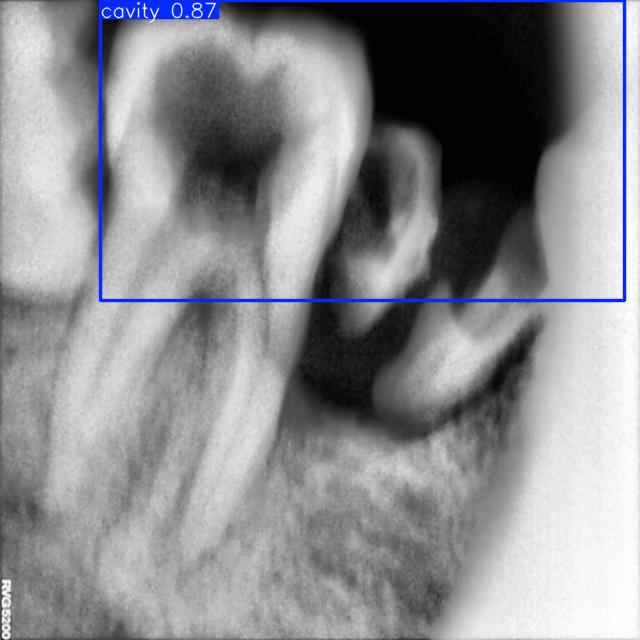

In [3]:
results = model('/kaggle/input/cavity-datasets/images/val/image_5608.jpg')  # or a path to test image

# Visualize results
results[0].show()


image 1/1 /kaggle/input/cavity-datasets/images/val/image_5630.jpg: 640x640 2 cavitys, 24.2ms
Speed: 1.5ms preprocess, 24.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


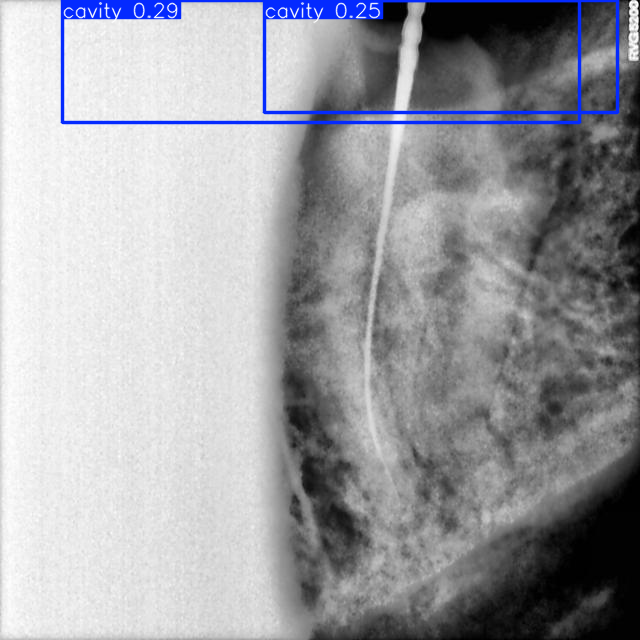

In [7]:
results = model('/kaggle/input/cavity-datasets/images/val/image_5630.jpg')  # or a path to test image

# Visualize results
results[0].show()

validation of the model

In [8]:
metrics = model.val()
print(metrics)  # Prints precision, recall, mAP50, mAP50-95


Ultralytics 8.3.123 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 143.7±29.5 MB/s, size: 84.5 KB)


val: Scanning /kaggle/input/aug-dataset/labels/train... 1495 images, 1 backgrounds, 0 corrupt: 100%|██████████| 1495/1495 [00:01<00:00, 762.44it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/aug-dataset/labels is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 187/187 [00:24<00:00,  7.71it/s]


                   all       1495       1524      0.973      0.959      0.989      0.865


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.3ms preprocess, 12.8ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/train22
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x789451f15dd0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     

comparing with the ground truth


image 1/1 /kaggle/input/cavity-datasets/images/val/image_5608.jpg: 640x640 1 cavity, 24.1ms
Speed: 1.6ms preprocess, 24.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


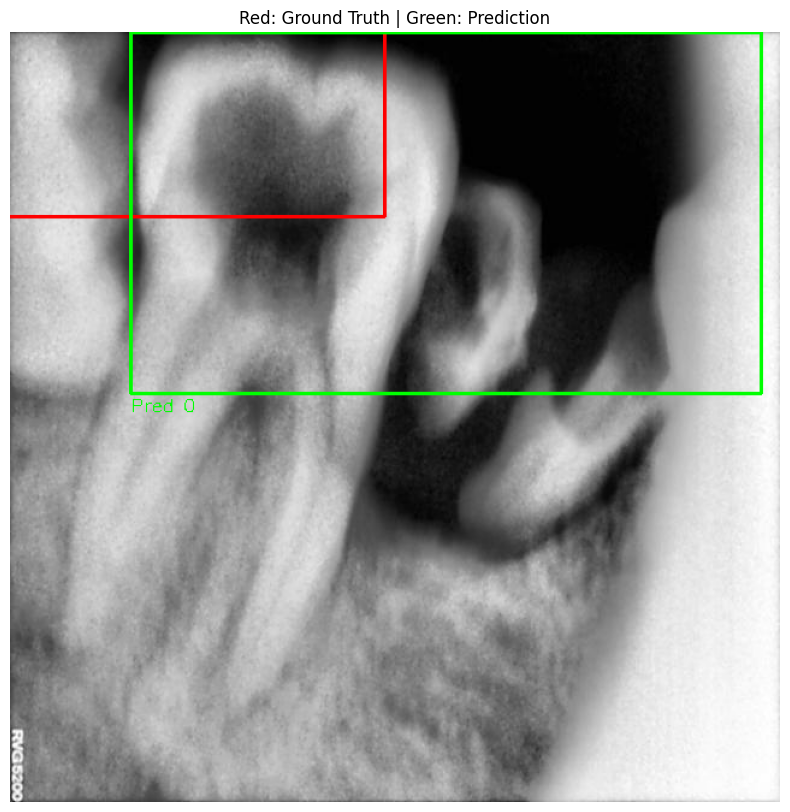

In [12]:
import cv2
import os

# Step 1: Run inference
results = model('/kaggle/input/cavity-datasets/images/val/image_5608.jpg')
pred_boxes = results[0].boxes.xywh.cpu().numpy()  # format: [x_center, y_center, w, h]
pred_classes = results[0].boxes.cls.cpu().numpy().astype(int)

# Step 2: Load the original image
image_path = '/kaggle/input/cavity-datasets/images/val/image_5608.jpg'
image = cv2.imread(image_path)

# Step 3: Load ground truth boxes from YOLO label file
label_path = '/kaggle/input/cavity-datasets/labels/val/image_5608.txt'
h, w = image.shape[:2]
gt_boxes = []
gt_classes = []

if os.path.exists(label_path):
    with open(label_path, 'r') as f:
        for line in f:
            class_id, x, y, bw, bh = map(float, line.strip().split())
            gt_classes.append(int(class_id))
            # Convert YOLO to pixel coordinates
            x1 = int((x - bw/2) * w)
            y1 = int((y - bh/2) * h)
            x2 = int((x + bw/2) * w)
            y2 = int((y + bh/2) * h)
            gt_boxes.append((x1, y1, x2, y2))

# Step 4: Draw ground truth in RED
for (x1, y1, x2, y2), cls in zip(gt_boxes, gt_classes):
    cv2.rectangle(image, (x1, y1), (x2, y2), (0, 0, 255), 2)
    cv2.putText(image, f"GT {cls}", (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)

# Step 5: Draw predictions in GREEN
for box, cls in zip(pred_boxes, pred_classes):
    x, y, bw, bh = box
    x1 = int((x - bw/2))
    y1 = int((y - bh/2))
    x2 = int((x + bw/2))
    y2 = int((y + bh/2))
    cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.putText(image, f"Pred {cls}", (x1, y2 + 15), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

# Step 6: Show image
from matplotlib import pyplot as plt
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Red: Ground Truth | Green: Prediction')
plt.show()



image 1/1 /kaggle/input/cavity-datasets/images/val/image_5648.jpg: 640x640 2 cavitys, 24.0ms
Speed: 1.7ms preprocess, 24.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


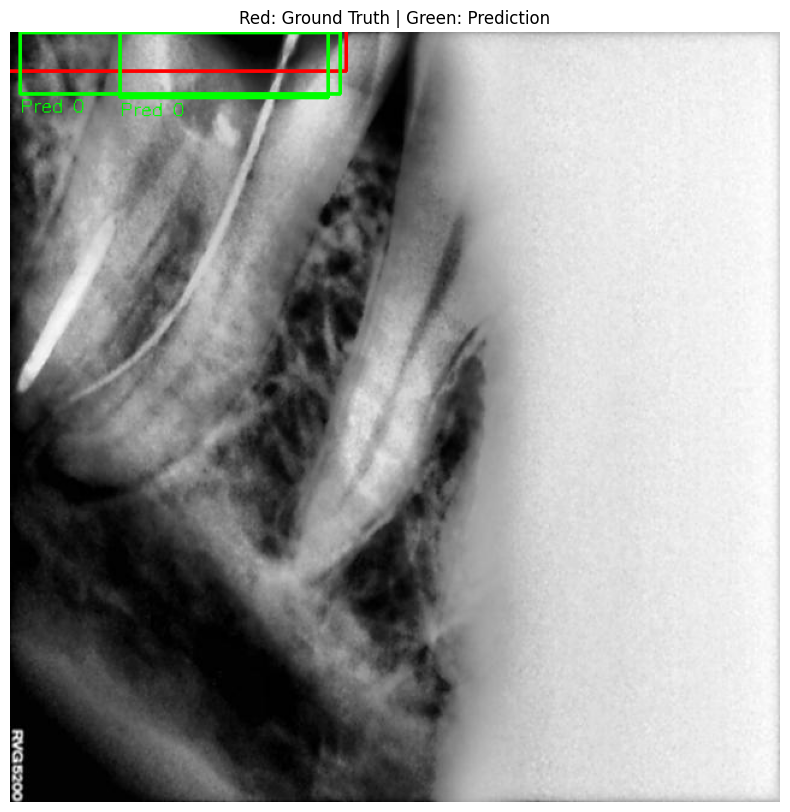

In [13]:
import cv2
import os

# Step 1: Run inference
results = model('/kaggle/input/cavity-datasets/images/val/image_5648.jpg')
pred_boxes = results[0].boxes.xywh.cpu().numpy()  # format: [x_center, y_center, w, h]
pred_classes = results[0].boxes.cls.cpu().numpy().astype(int)

# Step 2: Load the original image
image_path = '/kaggle/input/cavity-datasets/images/val/image_5648.jpg'
image = cv2.imread(image_path)

# Step 3: Load ground truth boxes from YOLO label file
label_path = '/kaggle/input/cavity-datasets/labels/val/image_5648.txt'
h, w = image.shape[:2]
gt_boxes = []
gt_classes = []

if os.path.exists(label_path):
    with open(label_path, 'r') as f:
        for line in f:
            class_id, x, y, bw, bh = map(float, line.strip().split())
            gt_classes.append(int(class_id))
            # Convert YOLO to pixel coordinates
            x1 = int((x - bw/2) * w)
            y1 = int((y - bh/2) * h)
            x2 = int((x + bw/2) * w)
            y2 = int((y + bh/2) * h)
            gt_boxes.append((x1, y1, x2, y2))

# Step 4: Draw ground truth in RED
for (x1, y1, x2, y2), cls in zip(gt_boxes, gt_classes):
    cv2.rectangle(image, (x1, y1), (x2, y2), (0, 0, 255), 2)
    cv2.putText(image, f"GT {cls}", (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)

# Step 5: Draw predictions in GREEN
for box, cls in zip(pred_boxes, pred_classes):
    x, y, bw, bh = box
    x1 = int((x - bw/2))
    y1 = int((y - bh/2))
    x2 = int((x + bw/2))
    y2 = int((y + bh/2))
    cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.putText(image, f"Pred {cls}", (x1, y2 + 15), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

# Step 6: Show image
from matplotlib import pyplot as plt
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Red: Ground Truth | Green: Prediction')
plt.show()



image 1/1 /kaggle/input/cavity-datasets/images/val/image_5630.jpg: 640x640 2 cavitys, 24.2ms
Speed: 1.8ms preprocess, 24.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


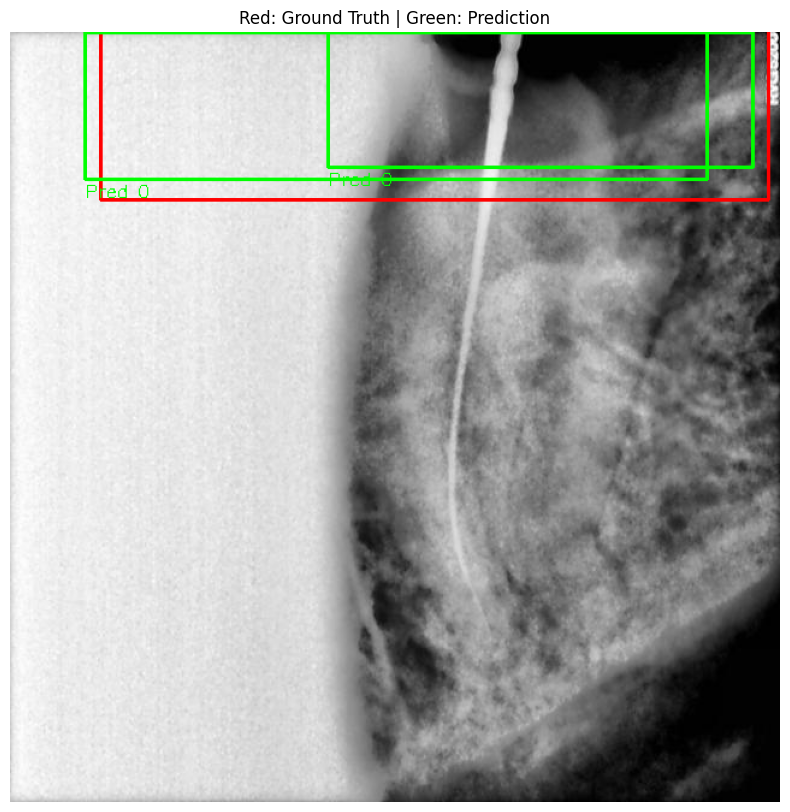

In [15]:
import cv2
import os

# Step 1: Run inference
results = model('/kaggle/input/cavity-datasets/images/val/image_5630.jpg')
pred_boxes = results[0].boxes.xywh.cpu().numpy()  # format: [x_center, y_center, w, h]
pred_classes = results[0].boxes.cls.cpu().numpy().astype(int)

# Step 2: Load the original image
image_path = '/kaggle/input/cavity-datasets/images/val/image_5630.jpg'
image = cv2.imread(image_path)

# Step 3: Load ground truth boxes from YOLO label file
label_path = '/kaggle/input/cavity-datasets/labels/val/image_5630.txt'
h, w = image.shape[:2]
gt_boxes = []
gt_classes = []

if os.path.exists(label_path):
    with open(label_path, 'r') as f:
        for line in f:
            class_id, x, y, bw, bh = map(float, line.strip().split())
            gt_classes.append(int(class_id))
            # Convert YOLO to pixel coordinates
            x1 = int((x - bw/2) * w)
            y1 = int((y - bh/2) * h)
            x2 = int((x + bw/2) * w)
            y2 = int((y + bh/2) * h)
            gt_boxes.append((x1, y1, x2, y2))

# Step 4: Draw ground truth in RED
for (x1, y1, x2, y2), cls in zip(gt_boxes, gt_classes):
    cv2.rectangle(image, (x1, y1), (x2, y2), (0, 0, 255), 2)
    cv2.putText(image, f"GT {cls}", (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)

# Step 5: Draw predictions in GREEN
for box, cls in zip(pred_boxes, pred_classes):
    x, y, bw, bh = box
    x1 = int((x - bw/2))
    y1 = int((y - bh/2))
    x2 = int((x + bw/2))
    y2 = int((y + bh/2))
    cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.putText(image, f"Pred {cls}", (x1, y2 + 15), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

# Step 6: Show image
from matplotlib import pyplot as plt
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Red: Ground Truth | Green: Prediction')
plt.show()


In [17]:
from ultralytics import YOLO

# Load your trained model (replace with best.pt if you trained)
model = YOLO('/kaggle/working/runs/detect/train2/weights/best.pt')

# Run prediction on all validation images and save outputs
results = model.predict(
    source='/kaggle/input/cavity-datasets/images/val',  # directory of images
    save=True,                                          # saves images with predictions
    conf=0.25,                                          # confidence threshold (optional)
    imgsz=640                                           # input image size (optional)
)



image 1/10 /kaggle/input/cavity-datasets/images/val/image_5608.jpg: 640x640 1 cavity, 8.6ms
image 2/10 /kaggle/input/cavity-datasets/images/val/image_5613.jpg: 640x640 1 cavity, 8.4ms
image 3/10 /kaggle/input/cavity-datasets/images/val/image_5617.jpg: 640x640 (no detections), 8.4ms
image 4/10 /kaggle/input/cavity-datasets/images/val/image_5620.jpg: 640x640 (no detections), 8.4ms
image 5/10 /kaggle/input/cavity-datasets/images/val/image_5622.jpg: 640x640 (no detections), 8.5ms
image 6/10 /kaggle/input/cavity-datasets/images/val/image_5629.jpg: 640x640 (no detections), 8.4ms
image 7/10 /kaggle/input/cavity-datasets/images/val/image_5630.jpg: 640x640 1 cavity, 8.4ms
image 8/10 /kaggle/input/cavity-datasets/images/val/image_5635.jpg: 640x640 (no detections), 8.4ms
image 9/10 /kaggle/input/cavity-datasets/images/val/image_5637.jpg: 640x640 (no detections), 8.4ms
image 10/10 /kaggle/input/cavity-datasets/images/val/image_5648.jpg: 640x640 1 cavity, 8.4ms
Speed: 1.3ms preprocess, 8.5ms infer

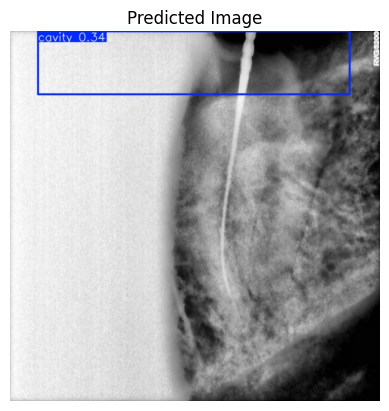

In [18]:
import os
import cv2
import matplotlib.pyplot as plt

# Load and show one of the predicted images
pred_img_path = '/kaggle/working/runs/detect/predict/image_5630.jpg'  # update with actual name
image = cv2.imread(pred_img_path)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("Predicted Image")
plt.show()


In [ ]:
!zip -r /kaggle/working/runs/detect/objectDetection.zip /kaggle/working/runs/detect

### **Image Segmentation**

In [5]:
import os
import cv2
import numpy as np
from glob import glob

# Paths
mask_dir = '/kaggle/input/aug-dataset/masks/train'
label_dir = '/kaggle/working/labels/train'
os.makedirs(label_dir, exist_ok=True)

# Class ID
class_id = 0

def mask_to_yolo_polygon(mask_path):
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    h, w = mask.shape
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    polygons = []
    for contour in contours:
        if len(contour) >= 6:  # at least 3 points (x,y)
            contour = contour.squeeze()
            if contour.ndim != 2:
                continue
            # Normalize
            normalized = contour.astype(float)
            normalized[:, 0] /= w
            normalized[:, 1] /= h
            flat = normalized.flatten()
            poly_str = ' '.join([f'{x:.6f}' for x in flat])
            polygons.append(f"{class_id} {poly_str}")
    return polygons

# Process all masks
for mask_path in glob(f"{mask_dir}/*.png"):
    base = os.path.basename(mask_path).replace('.png', '.txt')
    yolo_labels = mask_to_yolo_polygon(mask_path)

    with open(os.path.join(label_dir, base), 'w') as f:
        for line in yolo_labels:
            f.write(line + '\n')

print("✅ Conversion complete. YOLOv8 segmentation labels saved in:", label_dir)


✅ Conversion complete. YOLOv8 segmentation labels saved in: /kaggle/working/labels/train


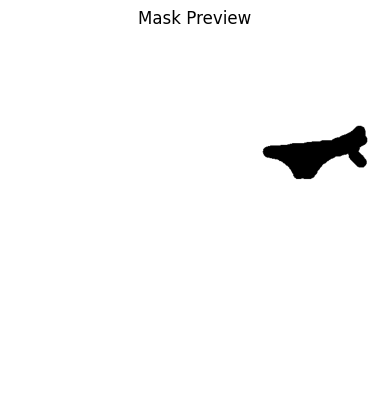

In [46]:
import cv2
import matplotlib.pyplot as plt

mask = cv2.imread('/kaggle/working/labels/train/aug_1_image_5995.png', cv2.IMREAD_GRAYSCALE)
plt.imshow(mask, cmap='gray')
plt.title("Mask Preview")
plt.axis('off')
plt.show()


In [7]:
import os
import shutil
from tqdm import tqdm

src_dir = '/kaggle/input/aug-dataset/images/train'
dst_dir = '/kaggle/working/images/train'
os.makedirs(dst_dir, exist_ok=True)

for file in tqdm(os.listdir(src_dir)):
    if file.endswith(('.jpg')):
        shutil.copy(os.path.join(src_dir, file), os.path.join(dst_dir, file))


100%|██████████| 1495/1495 [00:01<00:00, 843.74it/s]


In [2]:
pip install ultralytics


      Successfully uninstalled nvidia-cusparse-cu12-12.5.8.93
  Attempting uninstall: nvidia-cudnn-cu12
    Found existing installation: nvidia-cudnn-cu12 9.3.0.75
    Uninstalling nvidia-cudnn-cu12-9.3.0.75:
      Successfully uninstalled nvidia-cudnn-cu12-9.3.0.75
  Attempting uninstall: nvidia-cusolver-cu12
    Found existing installation: nvidia-cusolver-cu12 11.7.3.90
    Uninstalling nvidia-cusolver-cu12-11.7.3.90:
      Successfully uninstalled nvidia-cusolver-cu12-11.7.3.90
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pylibcugraph-cu12 24.12.0 requires pylibraft-cu12==24.12.*, but you have pylibraft-cu12 25.2.0 which is incompatible.
pylibcugraph-cu12 24.12.0 requires rmm-cu12==24.12.*, but you have rmm-cu12 25.2.0 which is incompatible.
Note: you may need to restart the kernel to use updated packages.


In [8]:
# Create a dataset YML configuration file for YOLO training

yml_content = """\
path: /kaggle/working/
train: images/train
val: images/train
nc: 1
names: ['cavity']

"""

# Write to a file
with open('data.yml', 'w') as f:
    f.write(yml_content)

print("YAML configuration file saved as 'data.yml'")


YAML configuration file saved as 'data.yml'


In [10]:
from ultralytics import YOLO

# Load the segmentation model config (starts from scratch)
model = YOLO('yolov8s-seg.pt')  # use yolov8s-seg.pt if you want pretrained

# Train with advanced settings
model.train(
    data='/kaggle/working/data.yml',  # Path to your dataset YAML
    epochs=100,                       # More epochs to allow patience to work
    imgsz=640,                        # Image size
    device=0,                         # GPU index
    batch=16,                         # Increase batch size if GPU has room
    patience=10,                      # Early stopping patience (default is 50)
    workers=4,                        # Dataloader workers
    amp=True,                         # Mixed precision training for faster training
    optimizer='AdamW',                # Often better for segmentation
    lr0=0.001,                        # Initial learning rate
    lrf=0.01,                         # Final learning rate fraction
    warmup_epochs=3,                 # Warmup to help stabilize early training
    weight_decay=0.01,                # Slight regularization
    dropout=0.1,                      # Mild dropout for regularization
    cos_lr=True,                      # Cosine LR schedule
    seed=42                           # Reproducibility
)


100%|██████████| 22.8M/22.8M [00:00<00:00, 46.3MB/s]


Ultralytics 8.3.123 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=segment, mode=train, model=yolov8s-seg.pt, data=/kaggle/working/data.yml, epochs=100, time=None, patience=10, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=4, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.1, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=Tru

train: Scanning /kaggle/working/labels/train.cache... 1245 images, 309 backgrounds, 0 corrupt: 100%|██████████| 1495/1495 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 634.8±505.3 MB/s, size: 95.3 KB)


val: Scanning /kaggle/working/labels/train.cache... 1245 images, 309 backgrounds, 0 corrupt: 100%|██████████| 1495/1495 [00:00<?, ?it/s]


Plotting labels to runs/segment/train3/labels.jpg... 
optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.01), 76 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/segment/train3
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/100      7.89G      2.609      4.795      7.051      2.511          3        640: 100%|██████████| 94/94 [00:38<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.36it/s]


                   all       1495       1260     0.0132     0.0238    0.00241   0.000651    0.00355    0.00476   0.000221   4.11e-05

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      2/100       5.6G      2.602      4.262      3.905      2.439          7        640: 100%|██████████| 94/94 [00:38<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:20<00:00,  2.34it/s]


                   all       1495       1260     0.0135       0.05     0.0035   0.000995    0.00969     0.0119    0.00105    0.00025

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      3/100      5.53G       2.61      4.241      3.872      2.464         11        640: 100%|██████████| 94/94 [00:38<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.43it/s]


                   all       1495       1260     0.0145     0.0143    0.00257   0.000667     0.0198     0.0175    0.00129   0.000243

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      4/100      5.38G       2.59      4.264      3.787      2.449         15        640: 100%|██████████| 94/94 [00:37<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:20<00:00,  2.30it/s]


                   all       1495       1260     0.0617     0.0563     0.0153      0.004     0.0392     0.0341    0.00793    0.00205

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      5/100      5.31G      2.457      4.189      3.718       2.38         13        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:20<00:00,  2.27it/s]


                   all       1495       1260     0.0245      0.101     0.0123    0.00372     0.0222     0.0706       0.01    0.00254

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      6/100      5.43G      2.479      4.214      3.715      2.352          9        640: 100%|██████████| 94/94 [00:37<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:20<00:00,  2.31it/s]


                   all       1495       1260     0.0811     0.0397      0.018    0.00587     0.0802     0.0302     0.0109    0.00257

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      7/100       5.3G       2.48      4.196       3.65      2.382         10        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:20<00:00,  2.33it/s]


                   all       1495       1260      0.105      0.073     0.0273    0.00849     0.0749     0.0481     0.0158    0.00434

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      8/100      5.43G      2.372      4.141      3.594      2.318         12        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:20<00:00,  2.34it/s]


                   all       1495       1260     0.0565     0.0595     0.0159    0.00512     0.0546       0.05      0.012    0.00312

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      9/100      5.34G      2.422      4.151      3.635      2.331          6        640: 100%|██████████| 94/94 [00:37<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:20<00:00,  2.35it/s]


                   all       1495       1260      0.104      0.023     0.0171    0.00461     0.0657     0.0421     0.0095    0.00211

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     10/100      5.41G      2.416      4.148      3.605      2.314          8        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.36it/s]


                   all       1495       1260      0.091     0.0738     0.0239    0.00786     0.0568       0.05     0.0106    0.00229

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     11/100      5.29G      2.337      4.139      3.579      2.285          9        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:20<00:00,  2.31it/s]


                   all       1495       1260     0.0969     0.0437     0.0291     0.0101     0.0865     0.0373     0.0198    0.00514

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     12/100      5.43G      2.315      4.022      3.573       2.26          9        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:20<00:00,  2.33it/s]


                   all       1495       1260      0.073     0.0619     0.0201    0.00655     0.0561     0.0476     0.0131    0.00373

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     13/100      5.44G       2.28      4.098      3.487       2.23          9        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.36it/s]


                   all       1495       1260      0.153     0.0698     0.0376      0.014      0.113     0.0548     0.0214      0.006

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     14/100      5.42G        2.3      4.061      3.476      2.218          5        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.36it/s]


                   all       1495       1260       0.14     0.0492     0.0358     0.0121      0.113     0.0397     0.0255    0.00751

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     15/100      5.52G      2.271      4.045      3.421      2.174          9        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.36it/s]


                   all       1495       1260      0.115      0.128     0.0388     0.0124     0.0881      0.101     0.0276    0.00807

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     16/100      5.62G      2.292      4.058       3.41      2.199         14        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:20<00:00,  2.34it/s]


                   all       1495       1260     0.0717     0.0722     0.0244    0.00649     0.0408     0.0373     0.0112    0.00181

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     17/100      5.52G      2.279      4.051      3.442      2.196          8        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.39it/s]


                   all       1495       1260      0.102     0.0675     0.0271    0.00908     0.0755       0.05     0.0156    0.00391

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     18/100      5.39G      2.213      3.953      3.372      2.125         12        640: 100%|██████████| 94/94 [00:37<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.36it/s]


                   all       1495       1260      0.122      0.077     0.0365     0.0132     0.0995     0.0627     0.0268    0.00895

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     19/100      5.33G      2.221      4.042      3.401      2.161         14        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:20<00:00,  2.32it/s]


                   all       1495       1260      0.129     0.0952     0.0318    0.00936      0.105     0.0746     0.0257    0.00642

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     20/100      5.42G      2.142      3.997      3.337      2.122         12        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.40it/s]


                   all       1495       1260      0.269     0.0341     0.0442     0.0168      0.206     0.0262     0.0302    0.00851

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     21/100       5.5G      2.142      3.897      3.305      2.089         10        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.38it/s]


                   all       1495       1260       0.16      0.115     0.0513     0.0188      0.126      0.096     0.0333    0.00923

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     22/100      5.41G      2.136      3.927      3.295      2.077          7        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.41it/s]


                   all       1495       1260      0.243     0.0706      0.051     0.0191      0.213     0.0619       0.04     0.0126

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     23/100      5.31G      2.133      3.895      3.268      2.058         14        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.39it/s]


                   all       1495       1260      0.145      0.126     0.0584     0.0209      0.125      0.107      0.041      0.012

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     24/100      5.39G      2.101      3.871      3.251      2.076         10        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.37it/s]


                   all       1495       1260       0.16      0.113     0.0571     0.0213      0.128     0.0944     0.0392     0.0126

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     25/100      5.29G      2.151      3.957      3.259      2.097         10        640: 100%|██████████| 94/94 [00:37<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.37it/s]


                   all       1495       1260      0.197        0.1     0.0593     0.0216      0.161     0.0857     0.0415     0.0121

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     26/100      5.39G      2.124      3.869      3.264      2.069         16        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.44it/s]

                   all       1495       1260      0.236     0.0611     0.0563     0.0199      0.187     0.0563     0.0346    0.00969



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     27/100      5.26G      2.078      3.843        3.2      2.054         13        640: 100%|██████████| 94/94 [00:37<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.39it/s]


                   all       1495       1260      0.177       0.14     0.0653      0.026      0.162      0.119     0.0478     0.0142

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     28/100      5.61G      2.048       3.85      3.205      2.034          7        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.38it/s]


                   all       1495       1260      0.194     0.0873     0.0619      0.025      0.168     0.0754     0.0464     0.0147

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     29/100      5.51G       2.06      3.864      3.196      2.052         11        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.42it/s]


                   all       1495       1260      0.189     0.0921     0.0611     0.0221      0.158      0.077     0.0429      0.013

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     30/100      5.37G      2.038      3.882      3.178      2.025          6        640: 100%|██████████| 94/94 [00:37<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.39it/s]


                   all       1495       1260      0.214     0.0936     0.0634     0.0241      0.185     0.0809     0.0419     0.0133

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     31/100      5.28G       2.03      3.768      3.114      2.028          7        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.40it/s]


                   all       1495       1260      0.205      0.156     0.0838     0.0291      0.168      0.126     0.0548     0.0156

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     32/100       5.4G      2.038      3.812      3.125      2.009          6        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.42it/s]

                   all       1495       1260      0.217       0.14     0.0746       0.03      0.188       0.12     0.0565     0.0179



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     33/100      5.27G      1.998      3.739      3.055      1.994         10        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.39it/s]


                   all       1495       1260      0.233       0.13     0.0835     0.0318      0.181     0.0976     0.0514     0.0144

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     34/100       5.4G       2.02      3.818      3.081      2.008          5        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.37it/s]


                   all       1495       1260      0.206      0.179     0.0915     0.0371      0.173      0.155     0.0666     0.0207

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     35/100      5.32G      1.985      3.785      3.079      1.989         11        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.37it/s]


                   all       1495       1260       0.23      0.162      0.103      0.043      0.169      0.124     0.0667     0.0207

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     36/100       5.4G      1.927      3.682      3.017      1.956         12        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.35it/s]


                   all       1495       1260      0.226      0.183     0.0975     0.0407      0.189       0.16     0.0691     0.0205

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     37/100       5.3G      1.964      3.721      3.014      1.964         12        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.40it/s]


                   all       1495       1260      0.226      0.166      0.106     0.0459      0.191       0.14     0.0694     0.0216

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     38/100       5.4G      1.986      3.719      3.007       1.94          7        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.41it/s]


                   all       1495       1260      0.226      0.175      0.109     0.0467       0.19      0.148     0.0825     0.0259

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     39/100      5.41G      1.919      3.685      2.938       1.94         17        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.40it/s]


                   all       1495       1260      0.248      0.197      0.127     0.0558      0.216      0.163     0.0882     0.0263

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     40/100       5.4G      1.917      3.665       2.91      1.937          7        640: 100%|██████████| 94/94 [00:37<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.37it/s]


                   all       1495       1260      0.245      0.176       0.12     0.0493      0.202      0.148     0.0882     0.0262

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     41/100      5.57G      1.913      3.669      2.919      1.915          7        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.41it/s]


                   all       1495       1260      0.246      0.203      0.122     0.0523      0.215       0.17     0.0858      0.026

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     42/100      5.38G      1.947      3.691      2.927      1.916         11        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.40it/s]


                   all       1495       1260      0.212      0.197       0.12     0.0529      0.185      0.175      0.092     0.0286

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     43/100      5.28G      1.816      3.571      2.833      1.872         10        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.42it/s]


                   all       1495       1260      0.258      0.202      0.134     0.0617      0.218      0.175      0.106     0.0344

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     44/100      5.39G      1.881      3.603      2.854      1.913         10        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.42it/s]

                   all       1495       1260      0.255      0.217      0.149     0.0661       0.22       0.19      0.118     0.0382



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     45/100      5.27G      1.838      3.578      2.856      1.876          7        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.41it/s]

                   all       1495       1260      0.255       0.21      0.142     0.0672      0.213      0.179      0.105     0.0344



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     46/100      5.38G      1.843      3.652      2.893      1.873          8        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.40it/s]


                   all       1495       1260      0.262      0.213      0.149     0.0679      0.213      0.192      0.105     0.0351

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     47/100      5.41G      1.804       3.58       2.79      1.833         12        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.41it/s]

                   all       1495       1260      0.277      0.263      0.173     0.0853      0.239      0.228      0.131     0.0425



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     48/100      5.38G      1.871      3.521      2.843      1.864         11        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.40it/s]


                   all       1495       1260      0.258      0.258      0.159     0.0756      0.229      0.215      0.121     0.0402

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     49/100      5.27G      1.804      3.529      2.783      1.844          4        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.41it/s]


                   all       1495       1260      0.284      0.225      0.165     0.0807       0.24       0.19      0.126      0.043

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     50/100      5.39G      1.769      3.494      2.713      1.803          8        640: 100%|██████████| 94/94 [00:37<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.41it/s]

                   all       1495       1260      0.292      0.267      0.167     0.0754       0.24      0.213      0.115     0.0332



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     51/100       5.4G      1.804      3.487      2.759      1.824          3        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.39it/s]


                   all       1495       1260      0.312      0.259      0.182     0.0878      0.268      0.228      0.137     0.0473

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     52/100      5.61G      1.766      3.463      2.725      1.811          9        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.40it/s]

                   all       1495       1260      0.307      0.275      0.195     0.0949      0.277      0.224      0.153     0.0543



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     53/100      5.49G      1.756      3.437      2.703      1.798         10        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.41it/s]

                   all       1495       1260      0.304      0.248      0.179     0.0846      0.275       0.22      0.149     0.0519



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     54/100      5.37G      1.772      3.472       2.68      1.801         11        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.42it/s]

                   all       1495       1260      0.315      0.287      0.202      0.101      0.279      0.254      0.163     0.0583



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     55/100      5.26G      1.713      3.364      2.611       1.77          7        640: 100%|██████████| 94/94 [00:37<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.40it/s]

                   all       1495       1260      0.283      0.324      0.197     0.0969      0.247      0.283      0.159      0.058



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     56/100       5.6G       1.75      3.425      2.679      1.796         12        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.38it/s]


                   all       1495       1260       0.32      0.298      0.215       0.11      0.282      0.263      0.176     0.0618

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     57/100      5.49G      1.751      3.362      2.632      1.793          4        640: 100%|██████████| 94/94 [00:38<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.41it/s]

                   all       1495       1260      0.291      0.313      0.214      0.109      0.268      0.284      0.174     0.0636



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     58/100      5.37G      1.739      3.387       2.59      1.784          9        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.39it/s]


                   all       1495       1260      0.335      0.333      0.228      0.116      0.316      0.298      0.191      0.068

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     59/100      5.27G      1.693      3.344      2.561      1.736         18        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.42it/s]

                   all       1495       1260      0.298      0.322      0.221      0.109      0.272      0.271       0.18     0.0648



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     60/100      5.38G      1.678      3.327      2.526      1.734          7        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.42it/s]

                   all       1495       1260      0.333      0.327      0.247      0.128      0.298      0.297      0.203     0.0765



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     61/100      5.26G      1.676      3.323      2.559      1.747          8        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.41it/s]

                   all       1495       1260      0.353      0.343       0.25      0.133      0.324      0.315      0.211     0.0792



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     62/100      5.38G      1.659      3.311      2.518      1.733          4        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.41it/s]

                   all       1495       1260      0.371      0.329      0.255      0.137       0.34      0.302      0.216      0.082



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     63/100      5.26G      1.651      3.264      2.465      1.715         12        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.42it/s]

                   all       1495       1260      0.328      0.366      0.255      0.136      0.314      0.329      0.215       0.08



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     64/100      5.38G      1.629      3.261      2.486      1.701          9        640: 100%|██████████| 94/94 [00:37<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.40it/s]

                   all       1495       1260      0.368      0.354      0.258      0.142      0.338      0.325      0.223     0.0866



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     65/100      5.26G      1.613      3.222      2.428       1.68         11        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.41it/s]

                   all       1495       1260      0.374      0.371      0.274      0.148      0.348      0.345      0.233     0.0909



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     66/100      5.38G      1.658      3.261      2.462      1.703          8        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.41it/s]

                   all       1495       1260      0.356      0.359      0.268      0.142       0.32      0.337       0.23     0.0872



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     67/100       5.3G      1.598      3.237      2.387      1.675         12        640: 100%|██████████| 94/94 [00:37<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.41it/s]

                   all       1495       1260      0.349      0.389      0.284      0.158      0.324      0.357      0.241      0.095



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     68/100      5.38G      1.604      3.181      2.428      1.659         11        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.41it/s]

                   all       1495       1260       0.36      0.383      0.282      0.158      0.339      0.359       0.25     0.0966



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     69/100      5.49G      1.581      3.203      2.352      1.656          4        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.41it/s]

                   all       1495       1260      0.362      0.397      0.282      0.155      0.342      0.371      0.246     0.0981



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     70/100      5.38G      1.574      3.169      2.372      1.653          8        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.42it/s]

                   all       1495       1260      0.388      0.406      0.301      0.168      0.346      0.374      0.255      0.101



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     71/100      5.48G      1.543      3.128      2.302      1.642          7        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.40it/s]

                   all       1495       1260      0.387      0.415      0.308      0.176      0.361      0.382       0.27       0.11



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     72/100      5.38G      1.519        3.1      2.305      1.626          7        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.40it/s]

                   all       1495       1260      0.388      0.405      0.312      0.177      0.364      0.379      0.271      0.114



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     73/100      5.38G      1.542      3.113      2.299      1.624          8        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.41it/s]

                   all       1495       1260      0.385      0.429      0.323      0.186       0.37      0.402      0.285      0.121



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     74/100      5.38G      1.504      3.072      2.286      1.604          8        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.42it/s]

                   all       1495       1260      0.377      0.428      0.319      0.188      0.354      0.402      0.287      0.123



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     75/100      5.62G      1.509      3.055      2.258      1.603         11        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.42it/s]

                   all       1495       1260      0.372      0.444      0.324      0.191      0.345      0.425      0.289      0.124



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     76/100      5.37G      1.519      3.113      2.275      1.611          7        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.42it/s]

                   all       1495       1260      0.396      0.447      0.339        0.2       0.38      0.421      0.308      0.131



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     77/100      5.55G      1.512      3.067      2.274      1.613          8        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.41it/s]

                   all       1495       1260       0.39      0.458      0.331      0.196      0.373      0.426      0.299      0.127



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     78/100      5.59G      1.491      3.047      2.256      1.574         11        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.42it/s]

                   all       1495       1260      0.377      0.462      0.341      0.202       0.37       0.43      0.311      0.134



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     79/100      5.47G      1.534      3.092      2.282      1.602         11        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.41it/s]

                   all       1495       1260      0.405      0.471      0.343      0.201      0.385      0.437      0.305      0.128



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     80/100      5.36G      1.477      2.994      2.226      1.581         11        640: 100%|██████████| 94/94 [00:37<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.41it/s]

                   all       1495       1260        0.4      0.482      0.347      0.209      0.379      0.452      0.317       0.14



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     81/100      5.26G      1.462      2.984      2.212      1.577          7        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.43it/s]

                   all       1495       1260      0.414      0.481      0.353      0.209      0.398      0.447      0.321       0.14



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     82/100      5.58G      1.423      2.984      2.194       1.55         12        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.42it/s]

                   all       1495       1260      0.411      0.483      0.356      0.211      0.397      0.448      0.319       0.14



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     83/100      5.47G      1.482      2.978       2.22      1.599         15        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.42it/s]

                   all       1495       1260      0.409      0.491      0.359      0.217       0.39      0.456      0.321      0.143



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     84/100      5.37G      1.459      2.994      2.212      1.583          9        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.42it/s]

                   all       1495       1260      0.417      0.502      0.361      0.218      0.405      0.466      0.328      0.144



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     85/100      5.39G      1.456      2.974      2.192      1.571          4        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.42it/s]

                   all       1495       1260      0.418      0.493      0.361      0.221      0.405      0.452       0.33      0.149



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     86/100      5.37G      1.413      2.914      2.166      1.534         13        640: 100%|██████████| 94/94 [00:37<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.42it/s]

                   all       1495       1260       0.42      0.502      0.363      0.222      0.401      0.476      0.331      0.148



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     87/100      5.39G      1.449      2.952      2.156      1.556         12        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.42it/s]

                   all       1495       1260      0.421      0.494      0.366      0.226      0.401      0.461      0.334      0.151



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     88/100      5.37G      1.423      2.935      2.137      1.547         16        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.41it/s]

                   all       1495       1260      0.421      0.499      0.371      0.228      0.403      0.478      0.338      0.152



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     89/100      5.47G       1.43      2.941       2.16      1.544         14        640: 100%|██████████| 94/94 [00:37<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.42it/s]

                   all       1495       1260      0.413      0.518      0.368      0.227      0.397      0.494      0.336      0.153



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     90/100      5.37G      1.411      2.924      2.113      1.547          6        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.41it/s]

                   all       1495       1260      0.426      0.502      0.372       0.23      0.412      0.485      0.342      0.155


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     91/100      5.26G      1.441      3.056      2.161      1.657          4        640: 100%|██████████| 94/94 [00:38<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.42it/s]

                   all       1495       1260      0.423      0.501      0.362      0.221      0.397      0.467      0.327      0.145



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     92/100      5.38G       1.38      2.946      2.094      1.596          9        640: 100%|██████████| 94/94 [00:37<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.42it/s]

                   all       1495       1260      0.417      0.503      0.365      0.226      0.397      0.476      0.333      0.149



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     93/100      5.26G      1.359      2.953      2.078      1.591          6        640: 100%|██████████| 94/94 [00:37<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.41it/s]

                   all       1495       1260      0.425      0.489      0.368      0.229      0.405      0.466      0.339      0.153



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     94/100      5.37G      1.371      2.982      2.066      1.606          5        640: 100%|██████████| 94/94 [00:37<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.41it/s]

                   all       1495       1260      0.424      0.494      0.372      0.231        0.4      0.474      0.339      0.153



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     95/100      5.26G      1.355        2.9      2.036      1.588          5        640: 100%|██████████| 94/94 [00:37<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.42it/s]

                   all       1495       1260      0.426      0.494      0.373      0.232      0.405      0.471       0.34      0.156



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     96/100      5.38G      1.338      2.898      1.991      1.588          7        640: 100%|██████████| 94/94 [00:37<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.43it/s]

                   all       1495       1260      0.421        0.5      0.374      0.234        0.4       0.48      0.343      0.157



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     97/100      5.26G      1.336      2.897      2.034      1.581          5        640: 100%|██████████| 94/94 [00:37<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.43it/s]

                   all       1495       1260       0.43      0.494      0.375      0.236       0.41      0.471      0.345      0.158



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     98/100      5.38G      1.348      2.884      2.016      1.577          7        640: 100%|██████████| 94/94 [00:37<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.41it/s]

                   all       1495       1260      0.427        0.5      0.374      0.235      0.407      0.477      0.344      0.158



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     99/100      5.26G      1.351      2.934      2.015      1.578          3        640: 100%|██████████| 94/94 [00:37<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.42it/s]

                   all       1495       1260      0.429      0.506      0.378      0.237      0.402      0.483      0.346      0.159



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    100/100      5.37G      1.312      2.883      2.011      1.569          5        640: 100%|██████████| 94/94 [00:37<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.42it/s]

                   all       1495       1260      0.427      0.512      0.377      0.237      0.407      0.488      0.348       0.16



100 epochs completed in 1.632 hours.
Optimizer stripped from runs/segment/train3/weights/last.pt, 23.9MB
Optimizer stripped from runs/segment/train3/weights/best.pt, 23.9MB

Validating runs/segment/train3/weights/best.pt...
Ultralytics 8.3.123 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv8s-seg summary (fused): 85 layers, 11,779,987 parameters, 0 gradients, 42.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   0%|          | 0/47 [00:00<?, ?it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   2%|▏         | 1/47 [00:00<00:18,  2.44it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   4%|▍         | 2/47 [00:01<00:27,  1.66it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:19<00:00,  2.35it/s]


                   all       1495       1260      0.426      0.512      0.377      0.237      0.407      0.485      0.347       0.16


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 8.2ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/segment/train3


ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x781d18f6cd90>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041, 

In [11]:
metrics = model.val()
print(metrics)


Ultralytics 8.3.123 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv8s-seg summary (fused): 85 layers, 11,779,987 parameters, 0 gradients, 42.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2113.8±500.6 MB/s, size: 94.2 KB)


val: Scanning /kaggle/working/labels/train.cache... 1245 images, 309 backgrounds, 0 corrupt: 100%|██████████| 1495/1495 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   0%|          | 0/94 [00:00<?, ?it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   1%|          | 1/94 [00:00<00:34,  2.72it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   2%|▏         | 2/94 [00:00<00:34,  2.69it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:16<00:00,  5.72it/s]


                   all       1495       1260      0.424      0.513      0.377      0.237      0.407       0.48      0.347       0.16


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.4ms preprocess, 6.3ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/segment/train32
ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x781d193c6010>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.03203

In [12]:
results = model.predict(source='/kaggle/input/cavity-datasets/images/val', save=True, imgsz=640)



image 1/10 /kaggle/input/cavity-datasets/images/val/image_5608.jpg: 640x640 (no detections), 10.4ms
image 2/10 /kaggle/input/cavity-datasets/images/val/image_5613.jpg: 640x640 (no detections), 10.2ms
image 3/10 /kaggle/input/cavity-datasets/images/val/image_5617.jpg: 640x640 (no detections), 10.3ms
image 4/10 /kaggle/input/cavity-datasets/images/val/image_5620.jpg: 640x640 (no detections), 10.3ms
image 5/10 /kaggle/input/cavity-datasets/images/val/image_5622.jpg: 640x640 (no detections), 10.3ms
image 6/10 /kaggle/input/cavity-datasets/images/val/image_5629.jpg: 640x640 (no detections), 10.3ms
image 7/10 /kaggle/input/cavity-datasets/images/val/image_5630.jpg: 640x640 (no detections), 10.2ms
image 8/10 /kaggle/input/cavity-datasets/images/val/image_5635.jpg: 640x640 (no detections), 10.2ms
image 9/10 /kaggle/input/cavity-datasets/images/val/image_5637.jpg: 640x640 (no detections), 10.2ms
image 10/10 /kaggle/input/cavity-datasets/images/val/image_5648.jpg: 640x640 1 cavity, 10.8ms
Speed

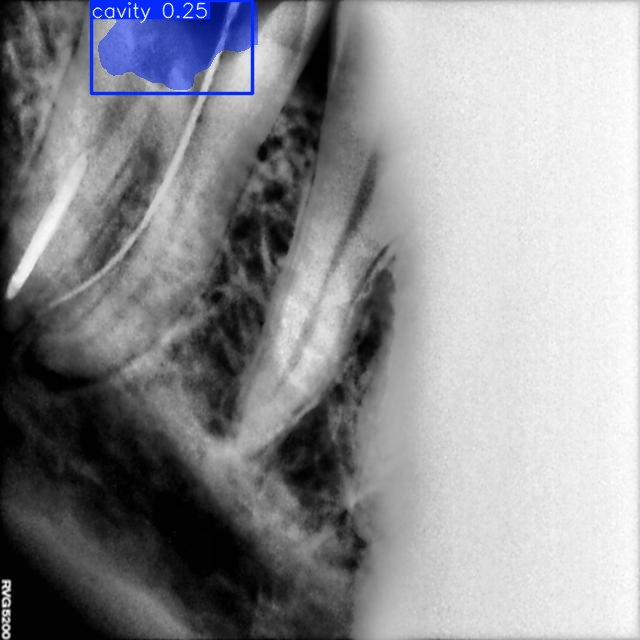

In [16]:
from PIL import Image
Image.open('/kaggle/working/runs/segment/train33/image_5648.jpg')

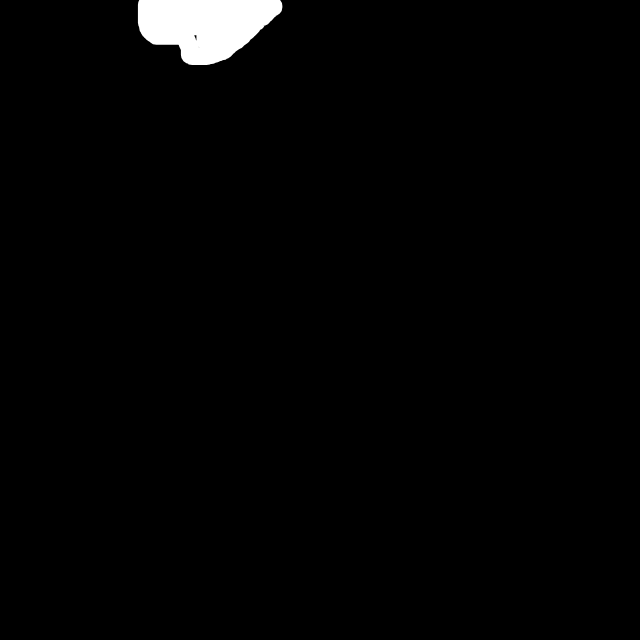

In [20]:
from PIL import Image
Image.open('/kaggle/input/cavity-datasets/masks/val/image_5648.png')


image 1/1 /kaggle/input/cavity-datasets/images/train/image_5876.jpg: 640x640 2 cavitys, 10.3ms
Speed: 1.7ms preprocess, 10.3ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


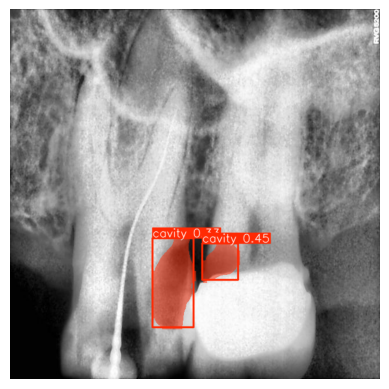

In [32]:
results = model.predict(source='/kaggle/input/cavity-datasets/images/train/image_5876.jpg', save=False, imgsz=640)

# Visualize the first image's prediction
result = results[0]
result.plot()  # This renders the prediction on an image

# Show it using matplotlib
plt.imshow(result.plot())
plt.axis('off')
plt.show()

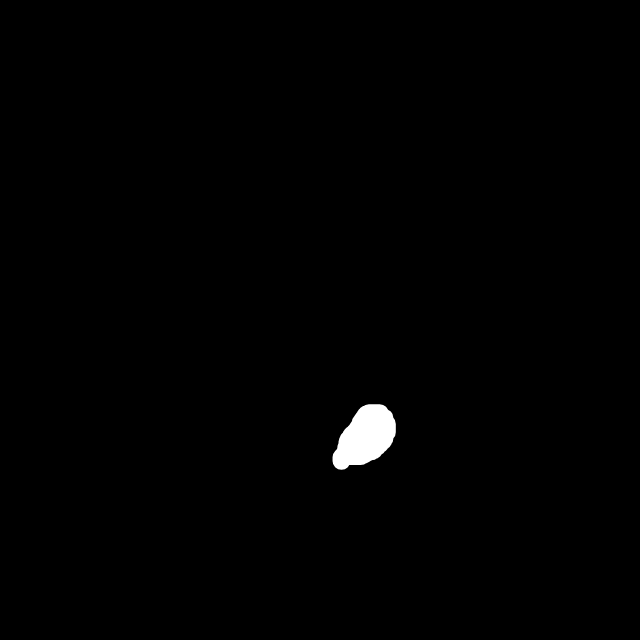

In [35]:
from PIL import Image
Image.open('/kaggle/input/cavity-datasets/masks/train/image_5876.png')

In [ ]:
!zip -r /kaggle/working/runs/segment.zip /kaggle/working/runs/segment